## Preparing data

In [23]:
import scanpy as sc
adata_raw=sc.read("data/adata_QC_filtered.h5ad")
adata=sc.read("data/adata_processed.h5ad")
adata=adata_raw[adata.obs_names]

In [24]:
adata

View of AnnData object with n_obs × n_vars = 8842 × 24489
    obs: 'plates', 'devtime', 'location', 'n_genes_by_counts', 'total_counts', 'total_counts_ERCC', 'pct_counts_ERCC'
    var: 'ERCC', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [25]:
sc.pp.filter_genes(adata,min_cells=5)

Trying to set attribute `.var` of view, copying.


In [26]:
sc.pp.normalize_total(adata,target_sum=1e3)
sc.pp.log1p(adata)

In [27]:
adata=sc.AnnData(adata.X,obs=adata.obs,var=adata.var)
adata.var["Gene"]=adata.var_names
adata.obs["CellID"]=adata.obs_names

In [22]:
adata.write_loom("scenic/adata.loom")

```bash
wget -P  scenic/cisTarget_databases https://resources.aertslab.org/cistarget/motif2tf/motifs-v9-nr.mgi-m0.001-o0.0.tbl \
  https://resources.aertslab.org/cistarget/databases/mus_musculus/mm10/refseq_r80/mc9nr/gene_based/mm10__refseq-r80__500bp_up_and_100bp_down_tss.mc9nr.feather \
  https://resources.aertslab.org/cistarget/databases/mus_musculus/mm10/refseq_r80/mc9nr/gene_based/mm10__refseq-r80__10kb_up_and_down_tss.mc9nr.feather
  
wget -P scenic/ https://raw.githubusercontent.com/aertslab/pySCENIC/master/resources/mm_mgi_tfs.txt
```

## Run SCENIC

```bash
docker run -it --rm -v $(pwd)/scenic:/scenicdata \
    aertslab/pyscenic:0.11.2 pyscenic grn \
        --num_workers 70 \
        -o /scenicdata/adjacencies.tsv \
        /scenicdata/adata.loom \
        /scenicdata/mm_mgi_tfs.txt
        
        
docker run --rm -v $(pwd)/scenic:/scenicdata \
    aertslab/pyscenic:0.11.2 pyscenic ctx \
        /scenicdata/adjacencies.tsv \
        /scenicdata/cisTarget_databases/mm10__refseq-r80__10kb_up_and_down_tss.mc9nr.feather \
        /scenicdata/cisTarget_databases/mm10__refseq-r80__500bp_up_and_100bp_down_tss.mc9nr.feather \
        --annotations_fname /scenicdata/cisTarget_databases/motifs-v9-nr.mgi-m0.001-o0.0.tbl \
        --expression_mtx_fname /scenicdata/adata.loom \
        --mode "dask_multiprocessing" \
        --output /scenicdata/regulons.csv \
        --num_workers 70
           
    
docker run --rm -v $(pwd)/scenic:/scenicdata \
    aertslab/pyscenic:0.11.2 pyscenic aucell \
    /scenicdata/adata.loom \
    /scenicdata/regulons.csv \
    -o /scenicdata/scenic.loom \
    --num_workers 70
```

In [125]:
import loompy as lp
import pandas as pd
lf = lp.connect("scenic/scenic.loom", mode='r+', validate=False )
#exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID)
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons

In [127]:
res=pd.concat([pd.Series(r.tolist(),index=regulons.dtype.names) for r in regulons],axis=1)

In [128]:
res.columns=lf.row_attrs["var_names"]

In [104]:
res.to_csv("scenic/regulon_mat.csv")

In [37]:
import pandas as pd
adata_genes=sc.read("data/adata_processed.h5ad")
adata=sc.AnnData(auc_mtx,
           obs=adata_genes.obs,uns=adata_genes.uns,obsm=adata_genes.obsm)

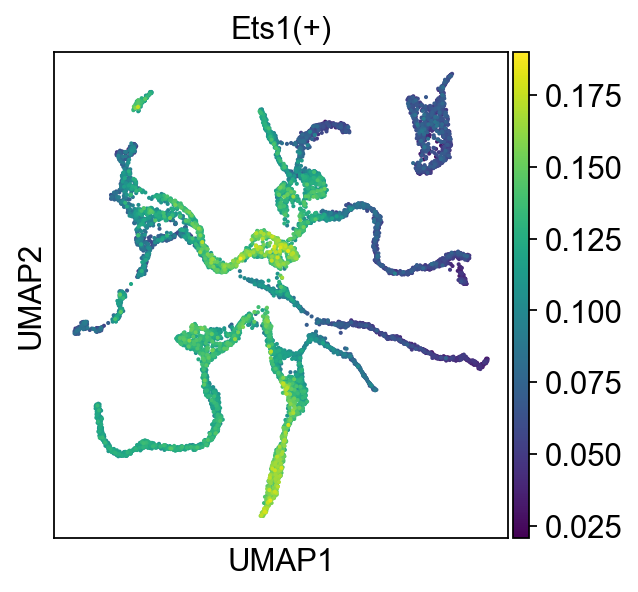

In [38]:
sc.set_figure_params()
sc.pl.umap(adata,color="Ets1(+)")

In [39]:
import numpy as np
genes=adata_genes.var_names
common=genes[genes.isin(np.array(list(map(lambda x: x.split("(")[0],adata.var_names))))]
adata=adata[:,common+"(+)"]
adata_genes=adata_genes[:,common]
adata.layers["auc_init"]=adata.X.copy()
weights=adata_genes.X.copy()
weights[weights>1]=1
adata.X=adata.X*weights.A
adata.layers["weigths"]=weights

In [40]:
sc.pp.filter_genes(adata,min_cells=10)

In [41]:
import pandas as pd
import palantir


findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.


In [42]:
import scanpy as sc
adata_a=sc.read("data/adata_assigned.h5ad")

adata.obs=adata_a.obs
adata.uns=adata_a.uns

In [76]:
sc.set_figure_params(dpi=150)
%matplotlib inline
#adata.obsm["X_diff"]=palantir.utils.determine_multiscale_space(dm_res,n_eigs=12).values
#adata.obsm["X_diff"]=dm_res["EigenVectors"].values[:,1:10]


dm_res = palantir.utils.run_diffusion_maps(pd.DataFrame(adata.X,index=adata.obs_names),knn=40)
#ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=10)
adata.obsm["X_diff"]=dm_res["EigenVectors"].iloc[:,1:7].values

sc.pp.neighbors(adata,n_neighbors=40,use_rep="X_diff",method="rapids")

Determing nearest neighbor graph...


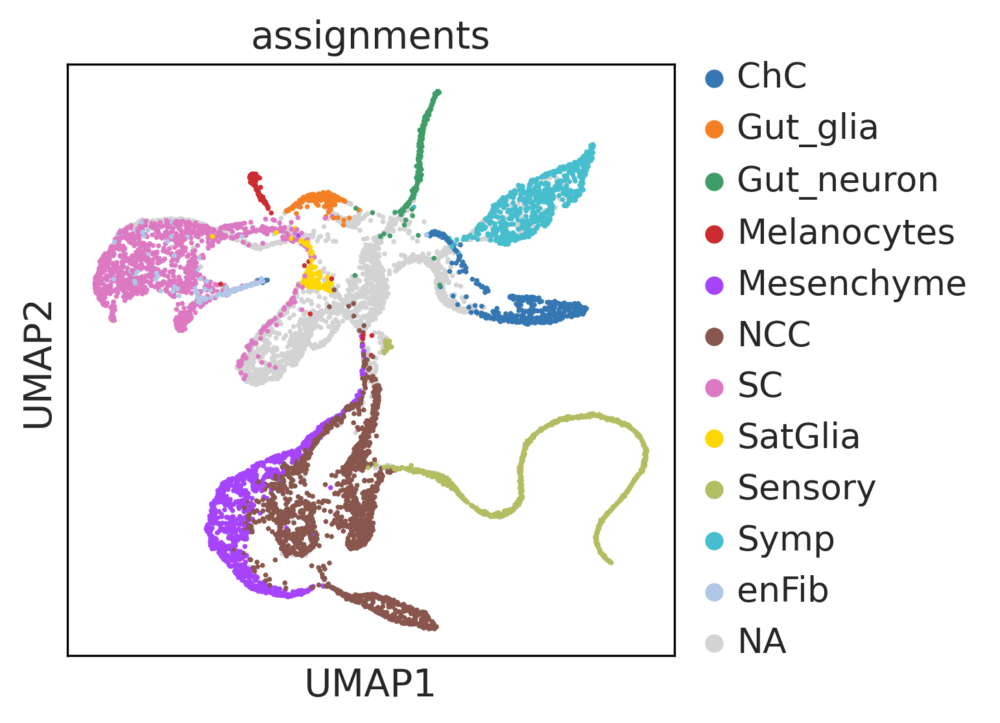

In [77]:
adata.obsm["X_umap"]=adata_a.obsm["X_umap"]
sc.tl.umap(adata,init_pos="X_umap")
sc.pl.umap(adata,color="assignments",
              groups=['ChC', 'Gut_glia', 'Gut_neuron', 'Melanocytes', 'NCC', 'Sensory', 'Symp','SC','enFib',"Mesenchyme","SatGlia"])

In [78]:
adata.write("data/adata_scenic.h5ad")

In [35]:
import scanpy as sc
adata=sc.read("data/adata_scenic.h5ad")

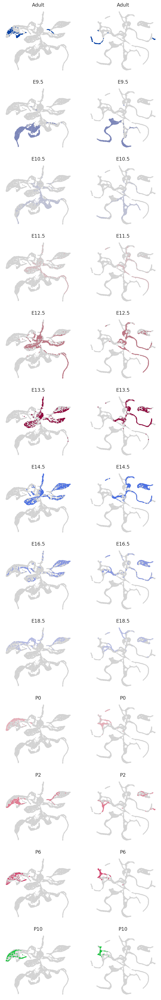

In [36]:
import scvelo as scv
import matplotlib.pyplot as plt
scv.set_figure_params(figsize=(3.5,3.5))
fig, axs=plt.subplots(13,2,figsize=(3.5*2,3.5*13))
for i,d in enumerate(adata.obs.devtime.cat.categories):
    scv.pl.umap(adata,color="devtime",groups=d,legend_loc="none",ax=axs[i,0],show=False)
    scv.pl.umap(adata_a,color="devtime",groups=d,legend_loc="none",ax=axs[i,1],show=False)
plt.savefig("figures/scenic_devtime_compa.png",bbox_inches="tight")

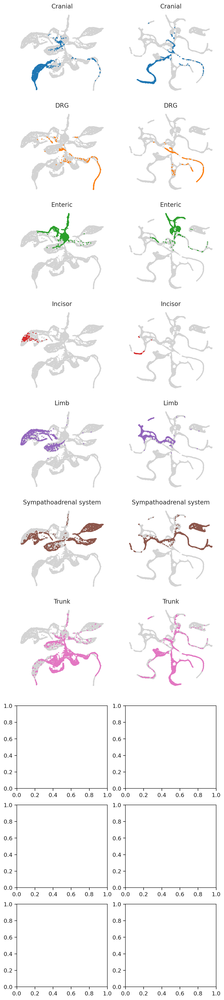

In [37]:
import scvelo as scv
import matplotlib.pyplot as plt
scv.set_figure_params(figsize=(3.5,3.5))
fig, axs=plt.subplots(10,2,figsize=(3.5*2,3.5*10))
for i,d in enumerate(adata.obs.location.cat.categories):
    scv.pl.umap(adata,color="location",groups=d,legend_loc="none",ax=axs[i,0],show=False)
    scv.pl.umap(adata_a,color="location",groups=d,legend_loc="none",ax=axs[i,1],show=False)
plt.savefig("figures/scenic_location_compa.png",bbox_inches="tight")

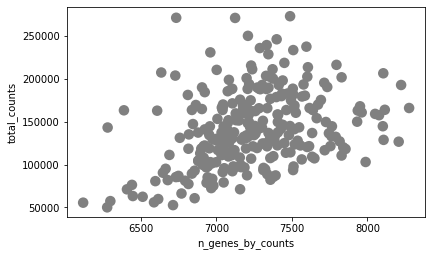

In [10]:
sc.pl.scatter(adata[adata.obs.plates.isin(["SS2_15_0088-2","SS2_15_0088"])],
              x="n_genes_by_counts",y="total_counts")

In [11]:
adata=adata[adata.obs.plates.isin(["SS2_15_0088-2","SS2_15_0088"])]

In [15]:
adata.obs

,plates,n_genes_by_counts,total_counts,total_counts_ERCC,pct_counts_ERCC,devtime,location,leiden,CytoTRACE,Gut_neuron,...,enFib,ChC,Gut_glia,NCC,Mesenchyme,Melanocytes,conflict,assignments,Hub,Hub_leiden
SS2_15_0088:A2_unique.bam,SS2_15_0088,7230,106829.0,6043.0,5.656703,E9.5,"Trunk (post-otic, anterior)",1,0.840791,False,...,False,False,False,True,False,False,False,NCC,False,False
SS2_15_0088:A4_unique.bam,SS2_15_0088,7450,124951.0,5426.0,4.342503,E9.5,"Trunk (post-otic, anterior)",6,0.926119,False,...,False,False,False,False,True,False,False,Mesenchyme,False,False
SS2_15_0088:A16_unique.bam,SS2_15_0088,7052,123424.0,7697.0,6.236227,E9.5,"Trunk (post-otic, anterior)",6,0.930281,False,...,False,False,False,False,True,False,False,Mesenchyme,False,False
SS2_15_0088:A13_unique.bam,SS2_15_0088,7112,97789.0,4670.0,4.775588,E9.5,"Trunk (post-otic, anterior)",6,0.985432,False,...,False,False,False,False,False,False,True,none,False,False
SS2_15_0088:A11_unique.bam,SS2_15_0088,7242,121163.0,6170.0,5.092313,E9.5,"Trunk (post-otic, anterior)",6,0.984391,False,...,False,False,False,False,False,False,True,none,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS2_15_0088-2:P7_unique.bam,SS2_15_0088-2,7431,179615.0,6546.0,3.644462,E9.5,"Trunk (post-otic, anterior)",6,0.994797,False,...,False,False,False,False,True,False,False,Mesenchyme,False,False
SS2_15_0088-2:P9_unique.bam,SS2_15_0088-2,7734,190247.0,6723.0,3.533827,E9.5,"Trunk (post-otic, anterior)",6,0.920916,False,...,False,False,False,False,True,False,False,Mesenchyme,False,False
SS2_15_0088-2:P17_unique.bam,SS2_15_0088-2,7526,160251.0,6236.0,3.891395,E9.5,"Trunk (post-otic, anterior)",6,0.938606,False,...,False,False,False,False,False,False,True,none,False,False
SS2_15_0088-2:P21_unique.bam,SS2_15_0088-2,7450,218312.0,9563.0,4.380428,E9.5,"Trunk (post-otic, anterior)",6,0.994797,False,...,False,False,False,False,False,False,True,none,False,False


In [16]:
adata.obs.loc[["SS2_15_0088:P7_unique.bam","SS2_15_0088-2:P7_unique.bam"]]

,plates,n_genes_by_counts,total_counts,total_counts_ERCC,pct_counts_ERCC,devtime,location,leiden,CytoTRACE,Gut_neuron,...,enFib,ChC,Gut_glia,NCC,Mesenchyme,Melanocytes,conflict,assignments,Hub,Hub_leiden
SS2_15_0088:P7_unique.bam,SS2_15_0088,7226,134035.0,4950.0,3.693065,E9.5,"Trunk (post-otic, anterior)",6,0.985432,False,...,False,False,False,False,True,False,False,Mesenchyme,False,False
SS2_15_0088-2:P7_unique.bam,SS2_15_0088-2,7431,179615.0,6546.0,3.644462,E9.5,"Trunk (post-otic, anterior)",6,0.994797,False,...,False,False,False,False,True,False,False,Mesenchyme,False,False


In [6]:
adata.obs.plates[adata.obs.location=='Trunk (post-otic, anterior)'].value_counts()

SS2_16_032       285
SS2_16_026       209
SS2_15_0088-2    136
SS2_15_0088      134
SS2_19_362         0
SS2_19_338         0
SS2_19_340         0
SS2_19_342         0
SS2_19_344         0
SS2_19_346         0
SS2_19_348         0
SS2_19_350         0
SS2_19_352         0
SS2_19_358         0
SS2_19_360         0
SS2_15_0073        0
SS2_19_364         0
SS2_19_322         0
SS2_19_366         0
SS2_19_372         0
SS2_19_374         0
SS2_20_079         0
SS2_20_081         0
SS2_20_083         0
SS2_20_085         0
SS2_20_087         0
SS2_19_324         0
SS2_18_107         0
SS2_18_109         0
SS2_16_250-2       0
SS2_15_0086        0
SS2_15_0087        0
SS2_15_0168        0
SS2_15_0169        0
SS2_15_0170        0
SS2_15_0171        0
SS2_15_0173        0
SS2_16_027         0
SS2_16_249-2       0
SS2_16_258-2       0
SS2_18_108         0
SS2_16_384         0
SS2_16_634         0
SS2_16_688         0
SS2_16_769         0
SS2_17_432         0
SS2_17_433         0
SS2_17_528   

In [58]:
import scFates as scf

In [85]:
scf.tl.tree(adata,Nodes=2000,method="ppt",device="gpu",seed=42,use_rep="X_diff",ppt_sigma=.001,ppt_lambda=1000,ppt_nsteps=100)

inferring a principal tree inferring a principal tree --> parameters used 
    2000 principal points, sigma = 0.001, lambda = 1000, metric = euclidean
    fitting:  60%|██████    | 60/100 [00:11<00:07,  5.38it/s]
    converged
    finished (0:00:11)     finished (0:00:11) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


    graph cleaned --> removed 151 principal points


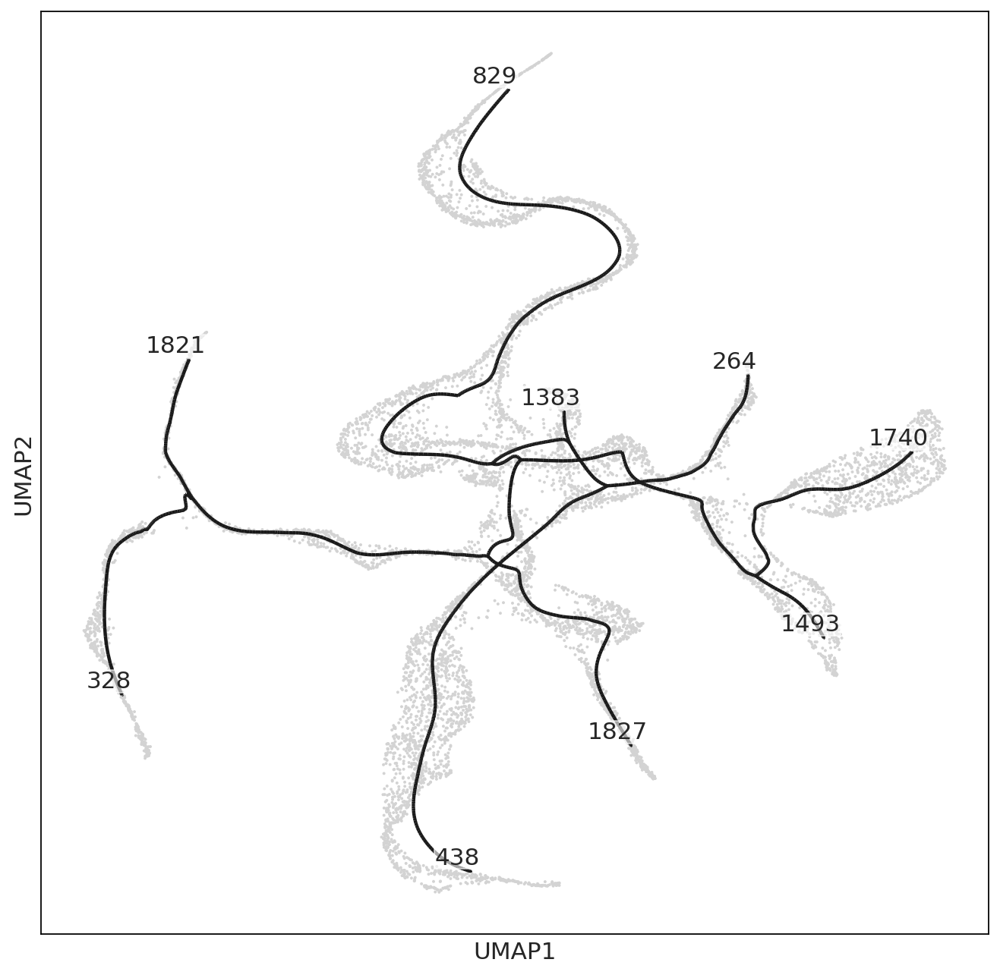

In [87]:
sc.set_figure_params(figsize=(10,10))
scf.tl.cleanup(adata,minbranchlength=20,leaves=[823,876])
scf.pl.graph(adata,size_nodes=.1,forks=False)

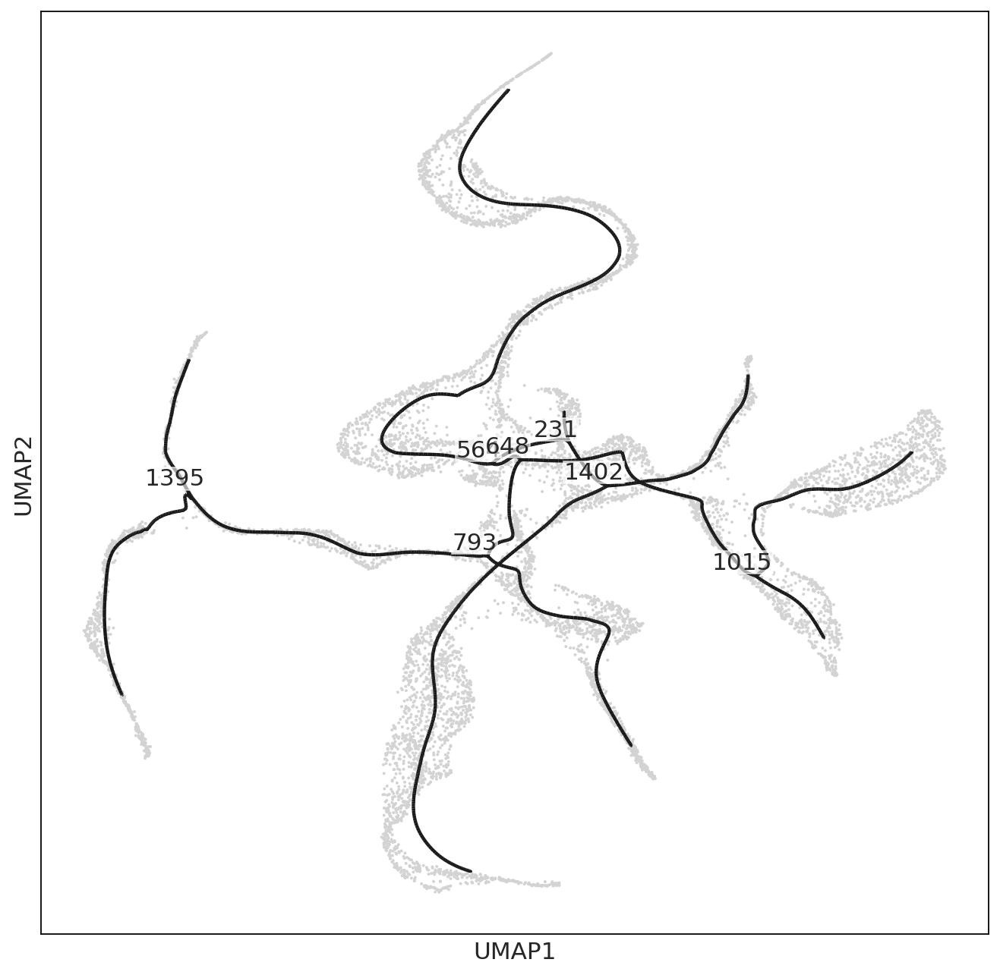

In [99]:
scf.pl.graph(adata,size_nodes=.1,tips=False)

In [98]:
import numpy as np
np.argmax(adata[adata[adata.obs.leiden=="1"].obs.CytoTRACE.idxmin()].obsm["X_R"])

1103

In [100]:
scf.tl.roots(adata,[1103,1827],meeting=564)

ValueError: no such vertex: '1103'

In [20]:
scf.tl.test_association(adata,n_jobs=20,A_cut=0.025)

test features for association with the trajectory
    single mapping :   0%|          | 0/166 [00:00<?, ?it/s]

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


    single mapping : 100%|██████████| 166/166 [00:13<00:00, 12.20it/s]
    found 74 significant features (0:00:13) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.


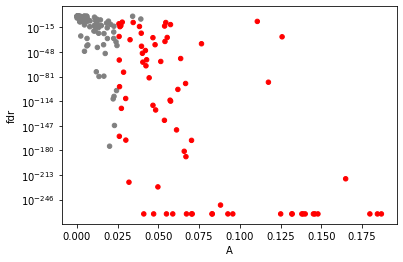

In [21]:
scf.pl.test_association(adata)

In [22]:
adata.uns["pseudotime_list"][str(0)]=adata.uns["pseudotime_list"][str(0)].loc[adata.obs_names]

In [23]:
scf.tl.fit(adata,n_jobs=20)

fit features associated with the trajectory
    single mapping :   0%|          | 0/74 [00:00<?, ?it/s]

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


    single mapping : 100%|██████████| 74/74 [00:02<00:00, 31.07it/s]
    finished (adata subsetted to keep only fitted features!) (0:00:02) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


In [24]:
import numpy as np
import igraph
import pandas as pd
import matplotlib.patches as patches
import matplotlib.pyplot as plt

from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=UserWarning)

def plot_updown(adata,ndots=3,ntops=4,key=None,cmap="RdBu_r",gglst=adata.var_names):
    
    graph = adata.uns["graph"]

    dct = graph["milestones"]
    keys = np.array(list(dct.keys()))
    vals = np.array(list(dct.values()))

    edges = graph["pp_seg"][["from", "to"]].astype(str).apply(tuple, axis=1).values
    img = igraph.Graph(directed=True)
    img.add_vertices(vals.astype(str))
    img.add_edges(edges)

    allpaths=img.get_all_shortest_paths(str(graph["root"]),to=graph["tips"].astype(str))

    allpaths=np.array(allpaths)[np.argsort(np.array([len(p) for p in allpaths]))]

    order=allpaths[0]
    for i in range(1,len(allpaths)):
        order=order+np.array(allpaths[i])[~np.isin(allpaths[i],order)].tolist()

    order=np.array(order)[1:]

    order=pd.Series(graph["milestones"].keys(),index=graph["milestones"].values())[np.array(img.vs["name"])[order].astype(int)]
    order=pd.Series(range(len(adata.obs.seg.cat.categories)),index=graph["pp_seg"]["to"])[order.index].values

    vs2mils=pd.Series(dct.keys(),index=dct.values())

    #gglst=adata.var_names

    def get_seg(s):
        start=adata.obs.milestones[adata.obs.t[s.index].idxmin()]
        end=adata.obs.milestones[adata.obs.t[s.index].idxmax()]
        return pd.DataFrame([adata[s.index[s==c],gglst].X.A.mean(axis=0) for c in [start,end]],
                             index=[start,end],columns=gglst).T
    
    def get_seg(s):
        return pd.DataFrame([adata[s.index[s==i],gglst].X.A.mean(axis=0) for i in s.cat.categories],
                             index=s.cat.categories,columns=gglst).T
    
    cellsel=[adata.obs.milestones[adata.obs.seg==s] for s in adata.obs.seg.cat.categories[order]]
    cellsel=[pd.cut(adata.obs.t[adata.obs.seg==s],ndots) for s in adata.obs.seg.cat.categories[order]]

    res=pd.concat([get_seg(s) for s in cellsel],axis=1)
    res=(res.T/res.max(axis=1).values).T*200

    res=res.iloc[::-1,:]
    from matplotlib.colors import LinearSegmentedColormap, ListedColormap, BoundaryNorm
    import matplotlib.cm as cm

    fig, axs = plt.subplots(
        1,
        len(order),
        constrained_layout=True,
        sharey=True,
        figsize=(ndots*len(order) / 3, 2*len(gglst) / 7)

    )
    from mpl_toolkits.axes_grid1 import make_axes_locatable

    pos=np.arange(len(order),0,-1)
    for i,s in enumerate(np.arange(0,len(order)*ndots,ndots)):
        tocomp=res.iloc[:,s:s+ndots]
        xs = np.arange(tocomp.shape[0])
        ys = np.arange(tocomp.shape[1])
        X, Y = np.meshgrid(xs, ys)
        
        ss=int(adata.obs.seg.cat.categories[order[i]][0])
        sel=adata.obs.milestones.cat.categories==vs2mils[graph["pp_seg"].loc[ss]["from"]]
        print(sel)
        start=np.array(adata.uns["milestones_colors"])[sel][0]
        sel=adata.obs.milestones.cat.categories==vs2mils[graph["pp_seg"].loc[ss]["to"]]
        end=np.array(adata.uns["milestones_colors"])[sel][0]

        from matplotlib.colors import LinearSegmentedColormap
        my_cm=LinearSegmentedColormap.from_list("aspect",[start,end])
        
        axs[i].scatter(
            Y, X, s=tocomp.values.T,c=tocomp.values.T,cmap=cmap,edgecolors='k',linewidth=.5
        )
        axs[i].grid(b=None)
        axs[i].set_yticks(range(tocomp.shape[0]));
        axs[i].set_yticklabels(gglst[::-1],style="italic");
        axs[i].set_xticks([])
        axs[i].set_xlim([-0.5, tocomp.shape[1] - 0.5])
        axs[i].set_ylim([-0.5, tocomp.shape[0] - 0.5])

        divider = make_axes_locatable(axs[i])
        cax = divider.new_vertical(size=.2, pad=0.05, pack_start=False)
        mappable = cm.ScalarMappable(cmap=my_cm)

        fig.add_axes(cax)
        cbar=fig.colorbar(mappable, cax=cax,orientation='horizontal')
        cbar.set_ticks([])

    #plt.savefig("figures/dotplot_updown.svg")

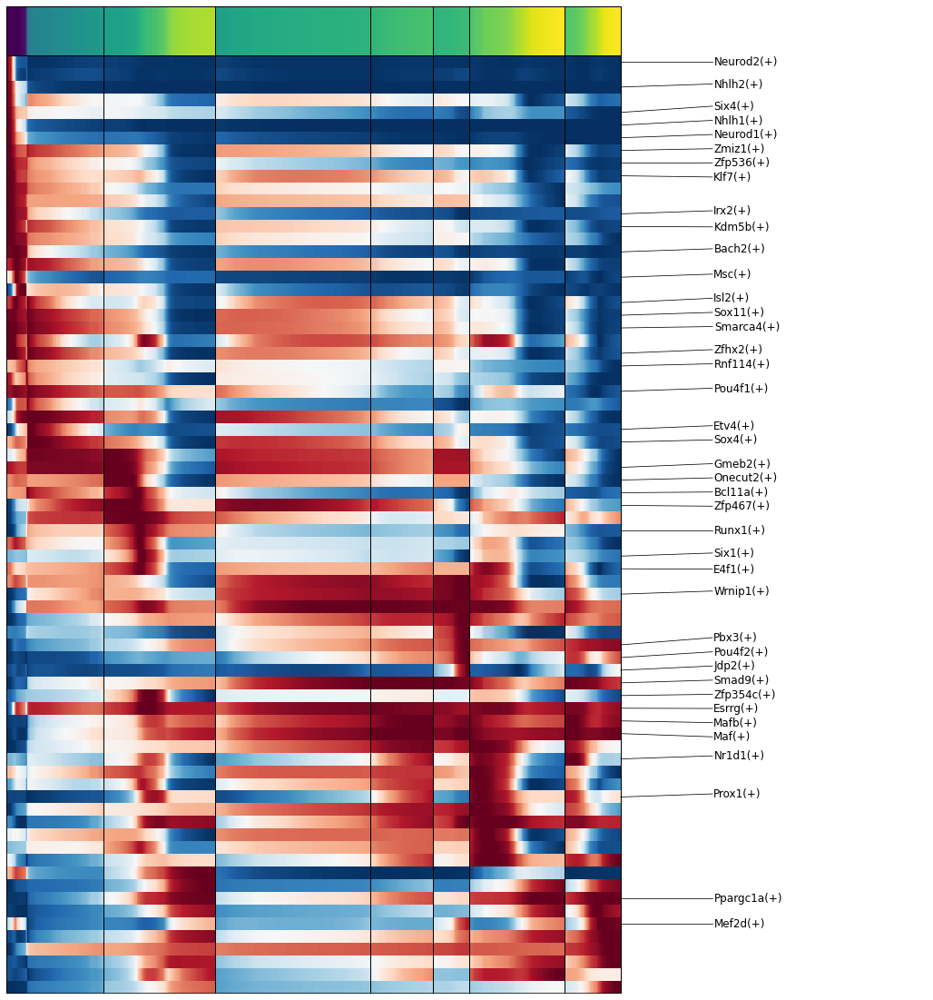

In [25]:
scf.pl.trends(adata,n_features=40,plot_emb=False,ordering="max",fig_heigth=20,ord_thre=.95,fontsize=12,save_genes="ordered_regulons.tsv")

In [26]:
reg=pd.read_csv("ordered_regulons.tsv",header=None).values.ravel()

In [27]:
from scipy.sparse import csr_matrix
adata.X=csr_matrix(adata.X)

In [28]:
c_early=pd.cut(adata.obs.loc[adata.obs.milestones=="A","t"],2)
c_early=c_early[c_early==c_early.cat.categories[0]].index

In [29]:
adata.obs.milestones=adata.obs.milestones.astype(str)

In [30]:
adata.obs.loc[c_early,"milestones"]="immature"

In [31]:
adata.obs.milestones=adata.obs.milestones.astype("category")

[False False False False False False False  True]
[ True False False False False False False False]
[ True False False False False False False False]
[False  True False False False False False False]
[False  True False False False False False False]
[False False  True False False False False False]
[False False  True False False False False False]
[False False False False False False False  True]
[ True False False False False False False False]
[ True False False False False False False False]
[False  True False False False False False False]
[False  True False False False False False False]
[False False  True False False False False False]
[False False  True False False False False False]


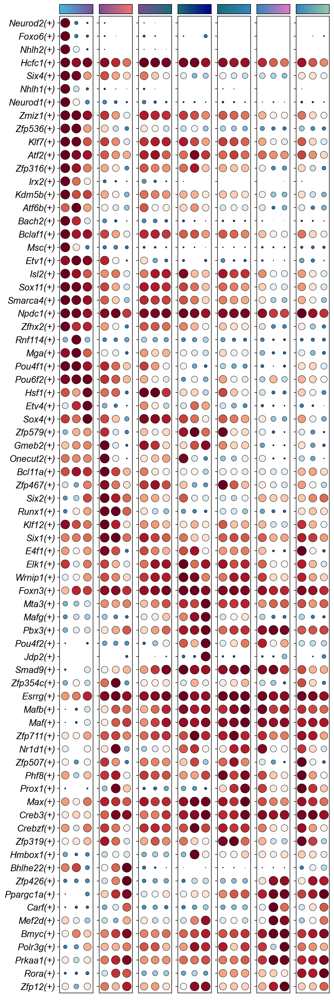

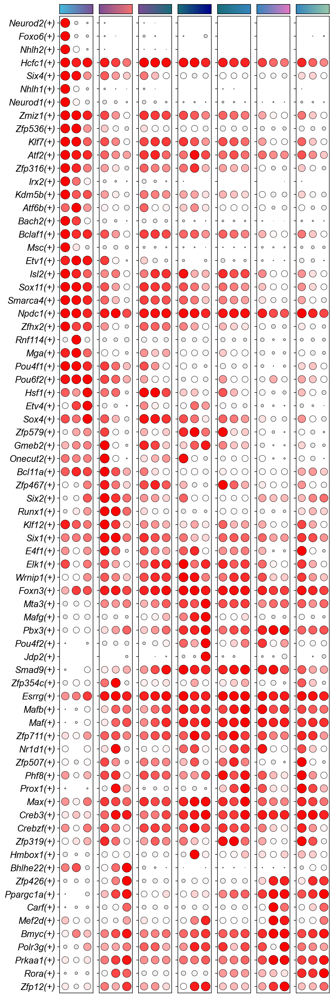

In [32]:
import matplotlib.pyplot as plt
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['Arial']

sc.set_figure_params()
from matplotlib.colors import LinearSegmentedColormap
cmap=LinearSegmentedColormap.from_list("aspect",["lightgrey","white","red"])

#adata.uns=uns
plot_updown(adata,cmap="RdBu_r",gglst=reg)
plt.savefig("figures/regulons_overview.svg",bbox_inches="tight")

plot_updown(adata,cmap=cmap,gglst=reg)
plt.savefig("figures/regulons_overview_greyred_colormap.svg",bbox_inches="tight")

array(['Neurod2(+)', 'Foxo6(+)', 'Nhlh2(+)', 'Hcfc1(+)', 'Six4(+)',
       'Nhlh1(+)', 'Neurod1(+)', 'Zmiz1(+)', 'Zfp536(+)', 'Klf7(+)',
       'Atf2(+)', 'Zfp316(+)', 'Irx2(+)', 'Kdm5b(+)', 'Atf6b(+)',
       'Bach2(+)', 'Bclaf1(+)', 'Msc(+)', 'Etv1(+)', 'Isl2(+)'],
      dtype=object)

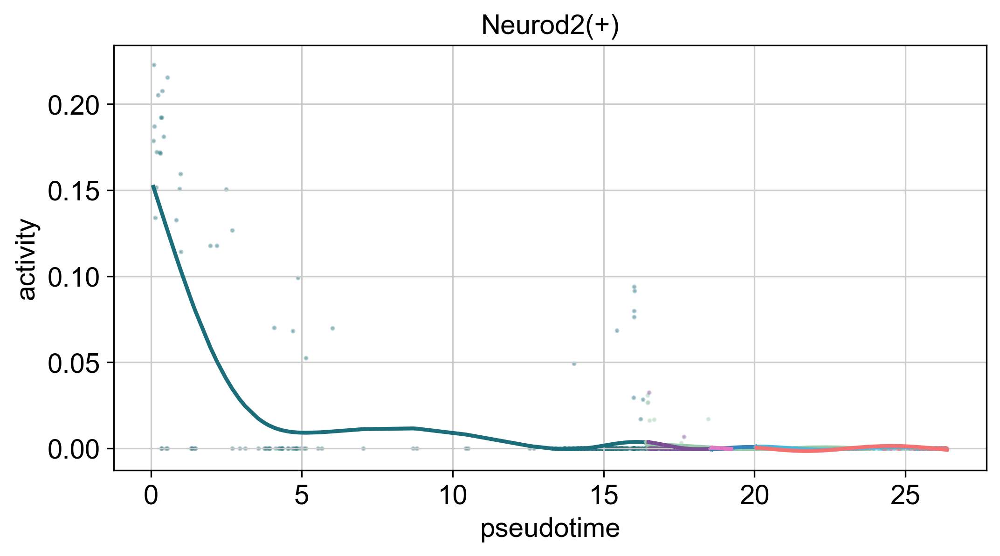

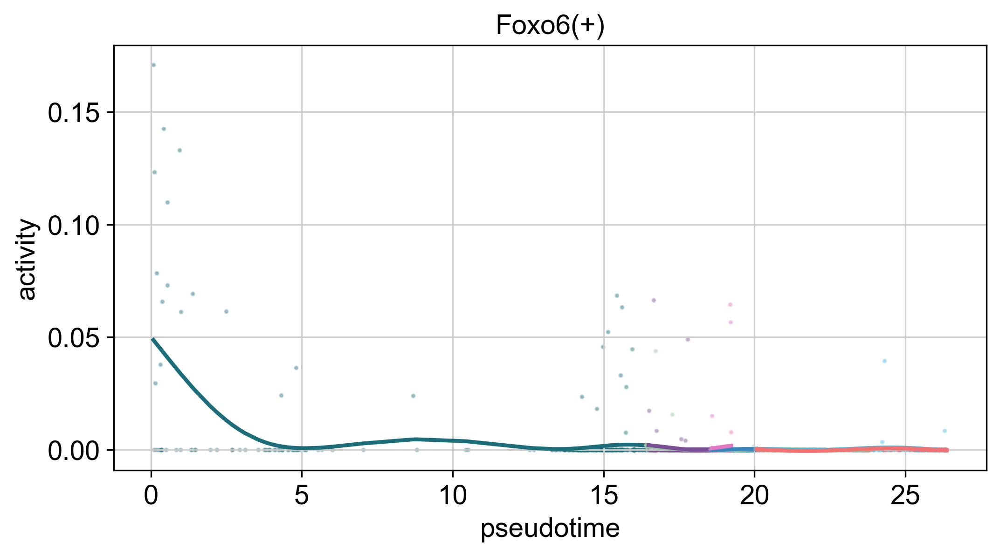

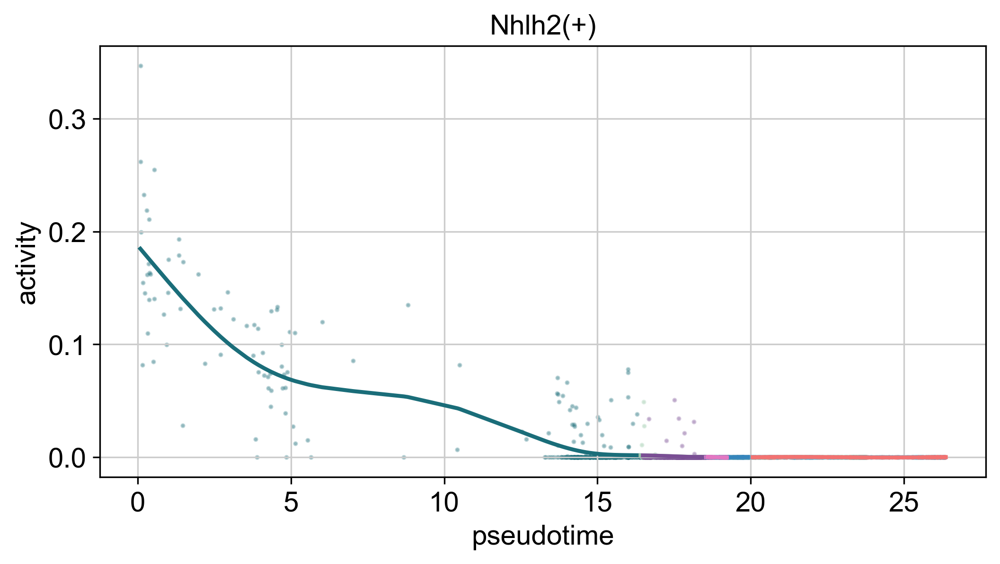

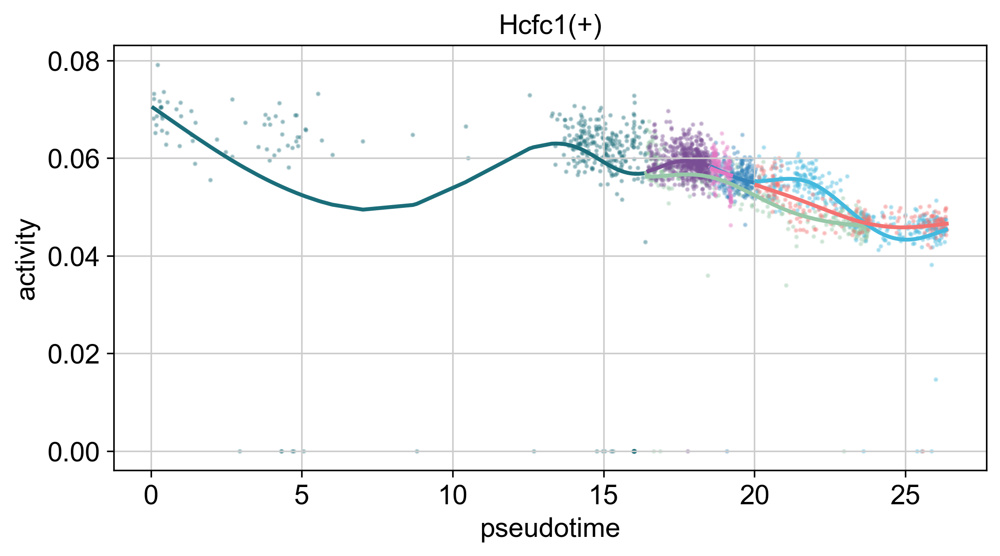

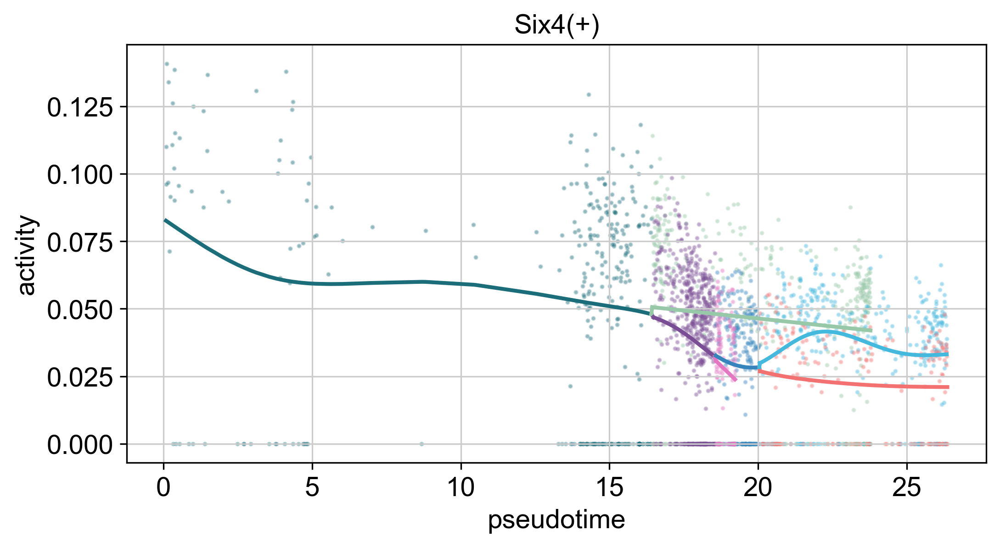

...

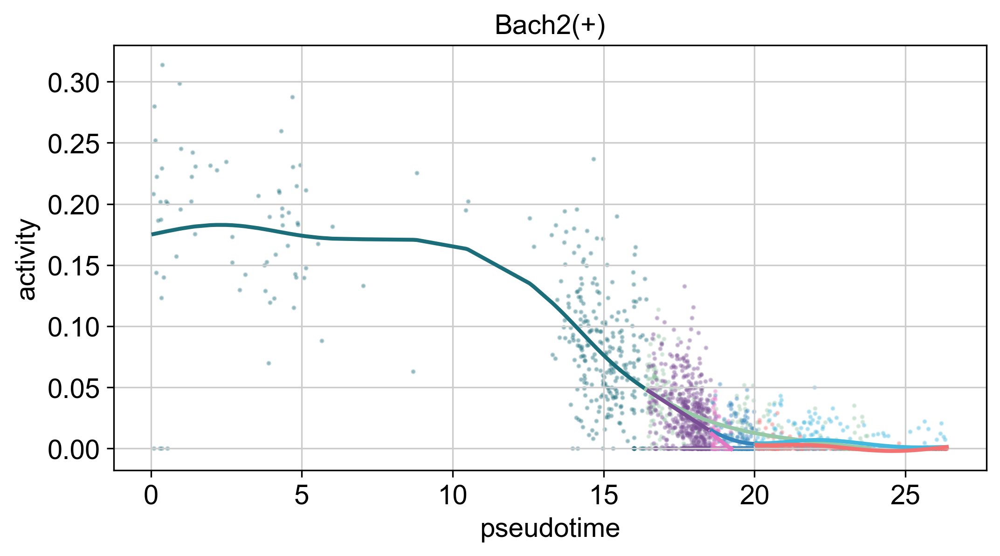

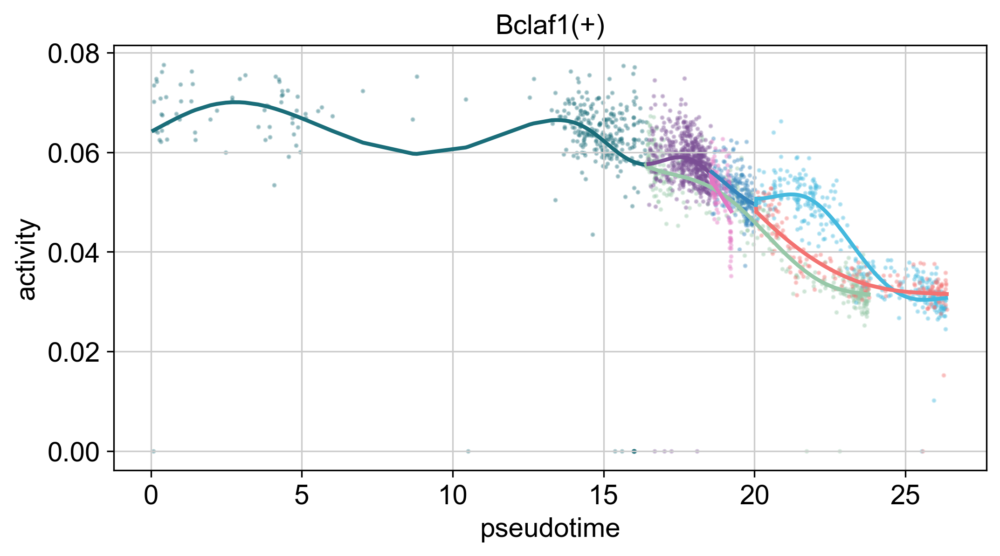

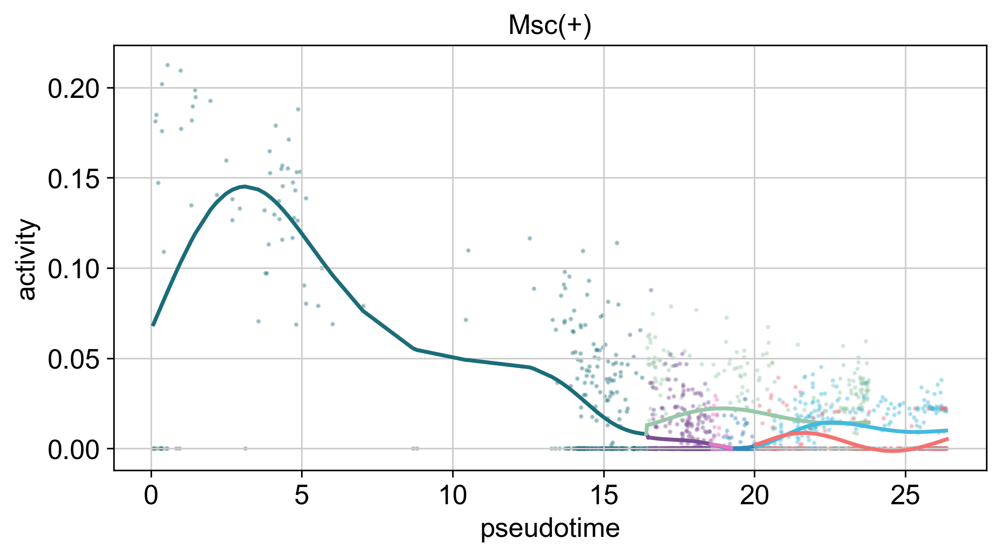

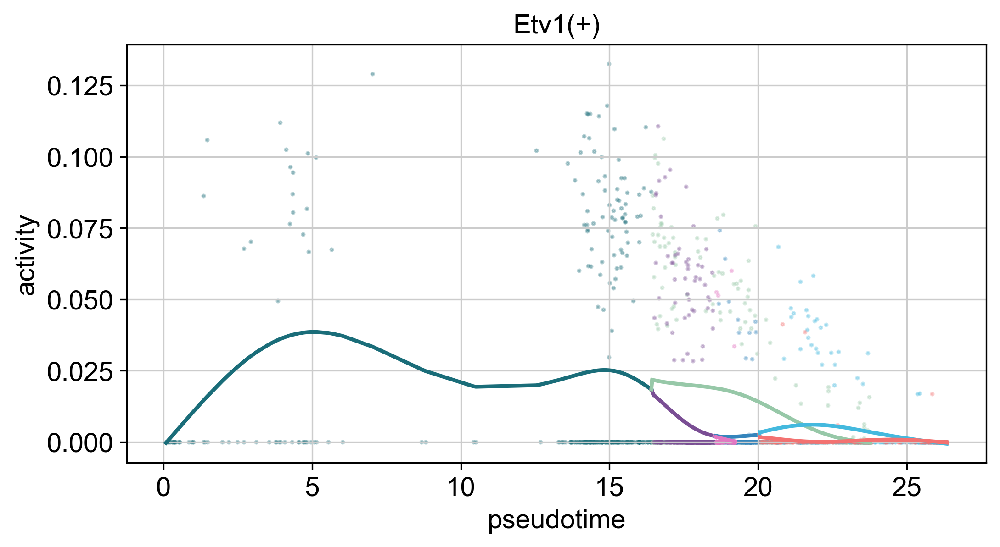

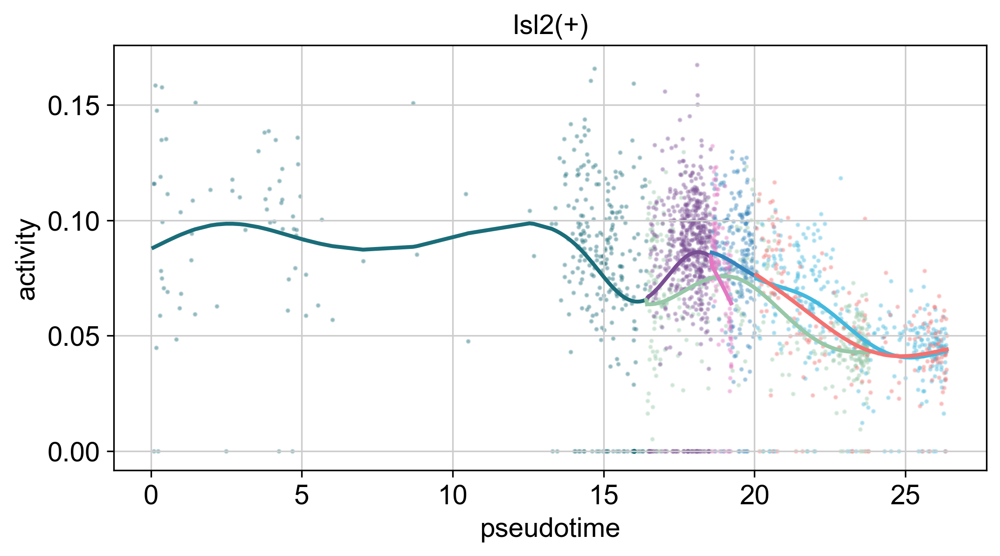

In [81]:
for g in reg[:20]:
    ax=scf.pl.single_trend(adata,g,show=False,plot_emb=False)
    ax.set_title(g)
    ax.set_ylabel("activity")
    plt.savefig("figures/regulon_trends_"+g+".png")

In [33]:
from matplotlib.colors import LinearSegmentedColormap
cmap=LinearSegmentedColormap.from_list("aspect",["lightgrey","white","red"])

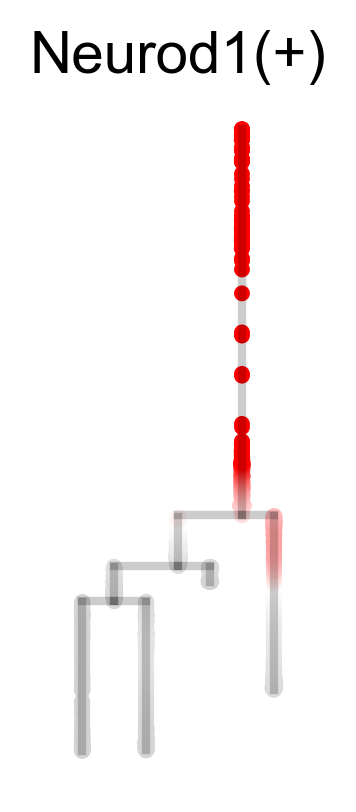

In [34]:
sc.set_figure_params(figsize=(1,3),frameon=False,dpi=150,dpi_save=600)
scf.pl.dendrogram(adata,color="Neurod1(+)",alpha_seg=.2,linewidth_seg=2,
                  show_info=False,cmap=cmap,layer="fitted",vmax="p95",save="_Neurod1_regulon.svg")

saving figure to file ./figures/scvelo_Neurod1_regulon.svg


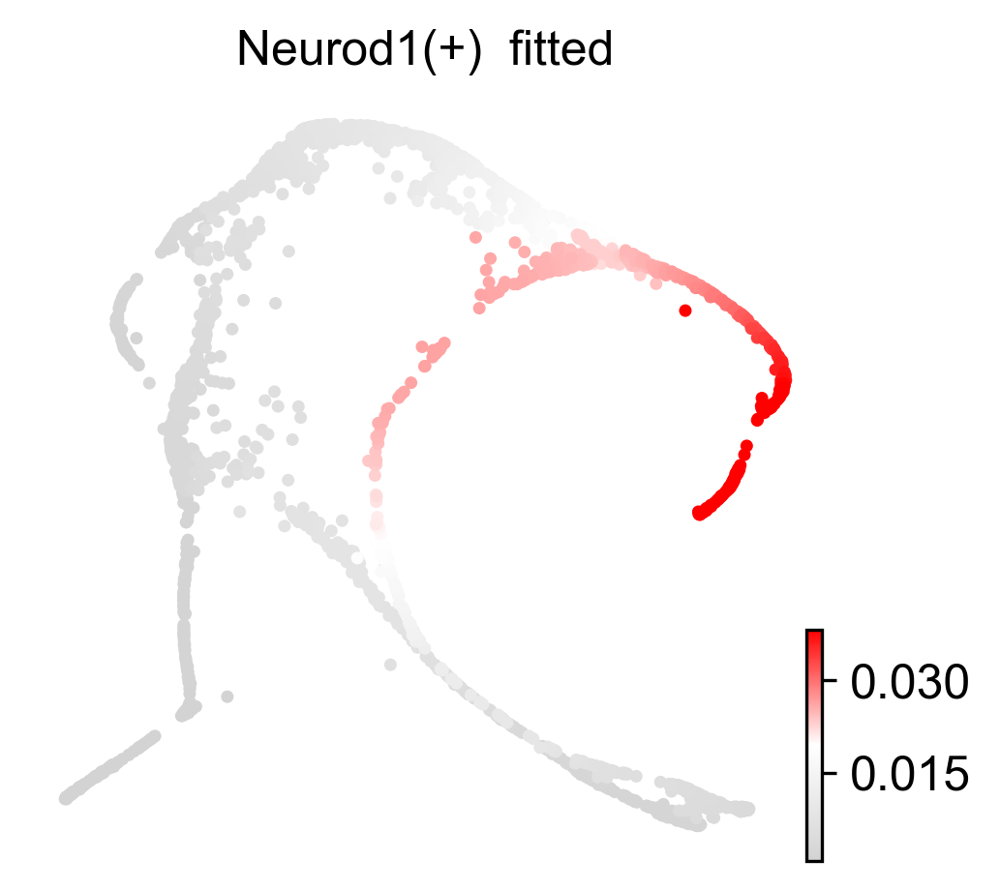

In [35]:
import scvelo as scv
scv.set_figure_params(frameon=False,figsize=(3.5,3.5),dpi=150,dpi_save=600)
scv.pl.draw_graph(adata,color="Neurod1(+)",cmap=cmap,layer="fitted",perc=[0,95],save="Neurod1_regulon.svg")

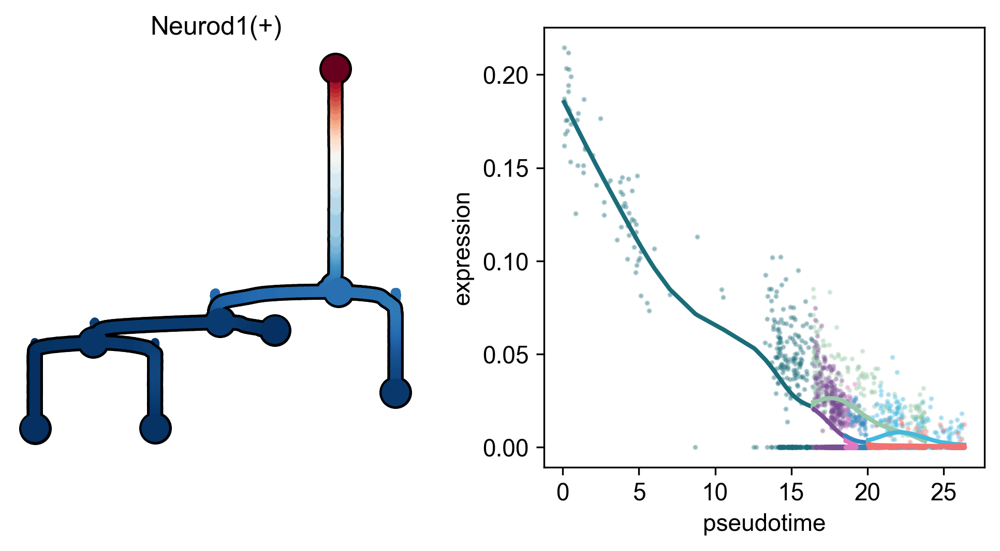

In [36]:
scf.pl.single_trend(adata,"Neurod1(+)",basis="dendro",)

subsetting tree
node 42 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph
    finished (0:00:00) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.
    finished (0:00:00) --> tree extracted
--> added 
    .obs['old_milestones'], previous milestones from intial tree
test features for association with the trajectory
    single mapping : 100%|██████████| 74/74 [00:15<00:00,  4.84it/s]
    found 32 significant features (0:00:15) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significan

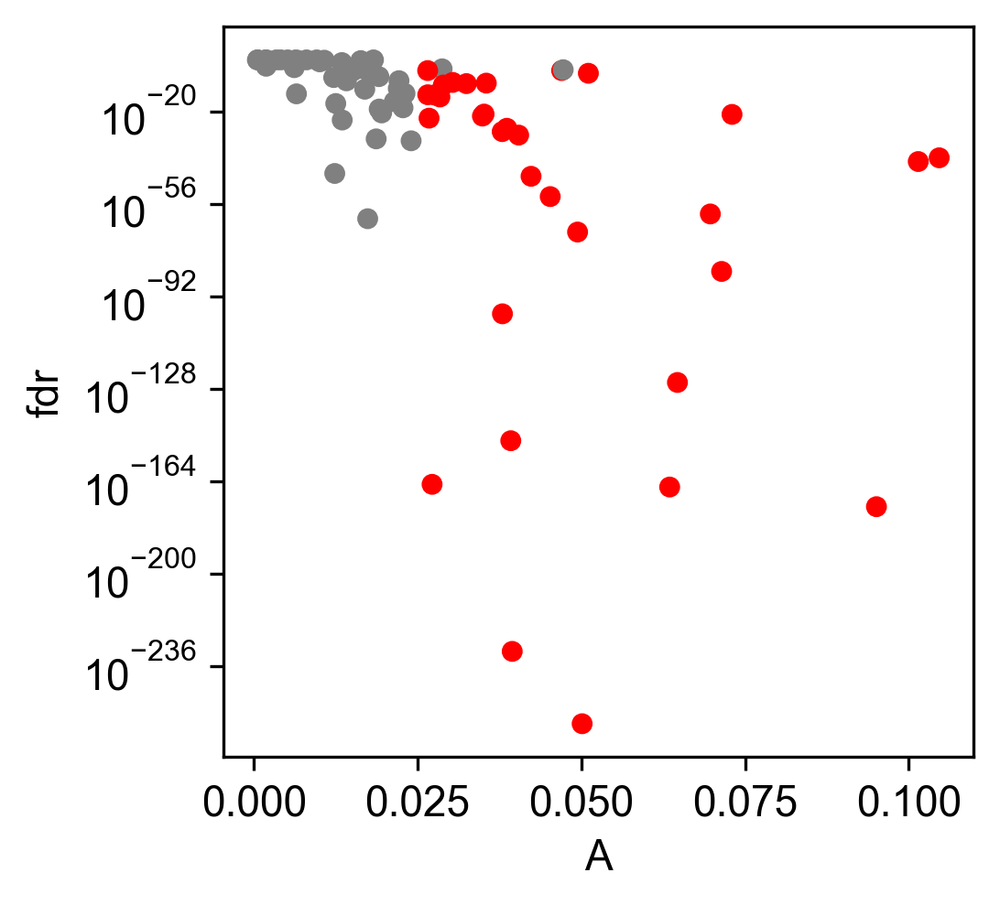

In [37]:
adata_Ic=scf.tl.subset_tree(adata,root_milestone="A",milestones=["Ic"],copy=True)
scf.tl.test_association(adata_Ic,n_jobs=40,A_cut=.025)
scf.pl.test_association(adata_Ic)
scf.tl.fit(adata_Ic,n_jobs=20)
#adata_Ic.write_h5ad("adata_Ic_tree.h5ad")

subsetting tree
node 91 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph
    finished (0:00:00) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.
    finished (0:00:00) --> tree extracted
--> added 
    .obs['old_milestones'], previous milestones from intial tree
test features for association with the trajectory
    single mapping : 100%|██████████| 74/74 [00:14<00:00,  4.95it/s]
    found 23 significant features (0:00:14) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significan

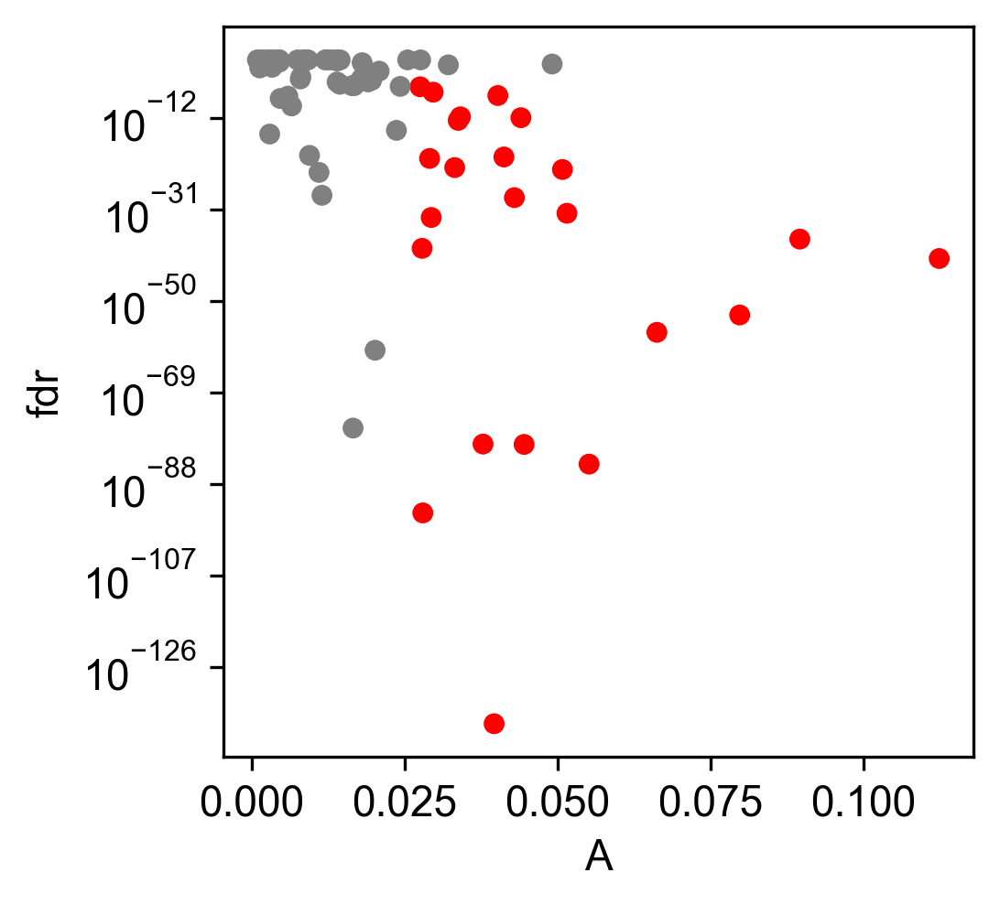

In [38]:
adata_II=scf.tl.subset_tree(adata,root_milestone="A",milestones=["II"],copy=True)
scf.tl.test_association(adata_II,n_jobs=40,A_cut=.025)
scf.pl.test_association(adata_II)
scf.tl.fit(adata_II,n_jobs=20)
#adata_II.write_h5ad("adata_II_tree.h5ad")

subsetting tree
node 149 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph
    finished (0:00:02) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.
    finished (0:00:00) --> tree extracted
--> added 
    .obs['old_milestones'], previous milestones from intial tree
test features for association with the trajectory
    single mapping : 100%|██████████| 74/74 [00:15<00:00,  4.71it/s]
    found 38 significant features (0:00:15) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significa

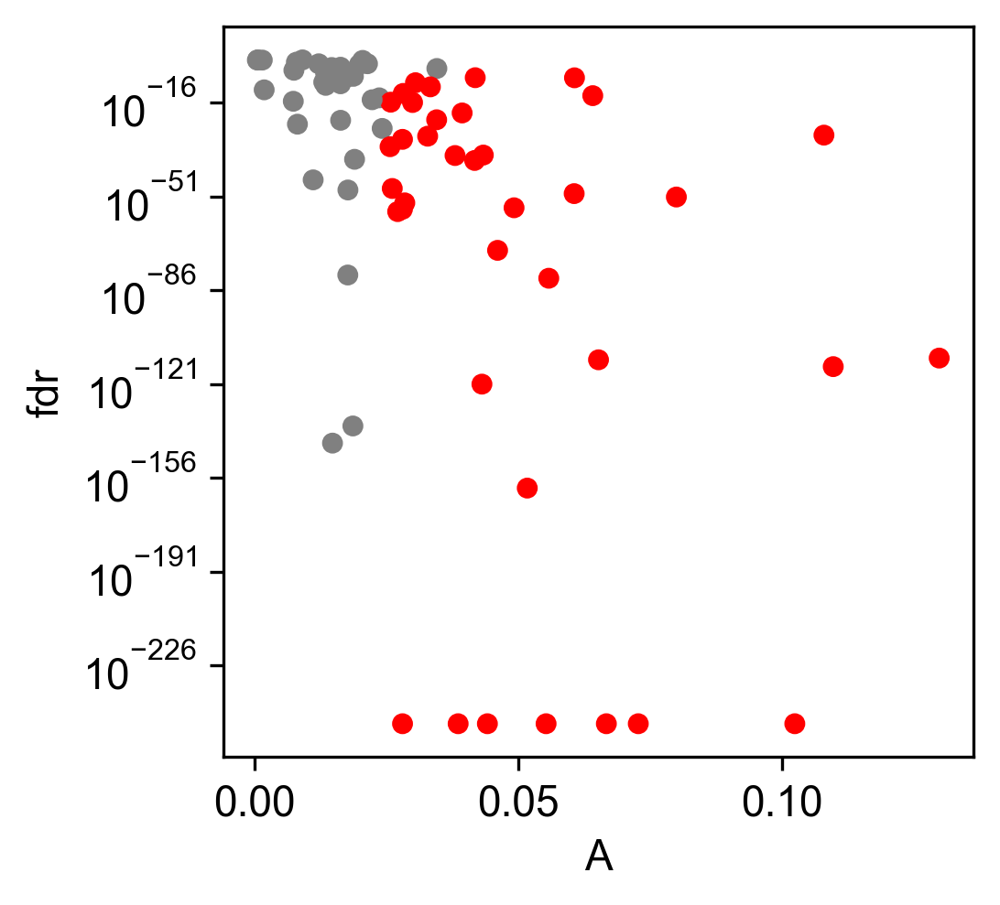

In [39]:
adata_Ia=scf.tl.subset_tree(adata,root_milestone="A",milestones=["Ia"],copy=True)
scf.tl.test_association(adata_Ia,n_jobs=40,A_cut=.025)
scf.pl.test_association(adata_Ia)
scf.tl.fit(adata_Ia,n_jobs=20)
#adata_Ia.write_h5ad("adata_Ia_tree.h5ad")

subsetting tree
node 111 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph
    finished (0:00:01) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned.
    .obs['milestones'] milestone assigned.
    .uns['pseudotime_list'] list of cell projection from all mappings.
    finished (0:00:00) --> tree extracted
--> added 
    .obs['old_milestones'], previous milestones from intial tree
test features for association with the trajectory
    single mapping : 100%|██████████| 74/74 [00:15<00:00,  4.84it/s]
    found 40 significant features (0:00:15) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significa

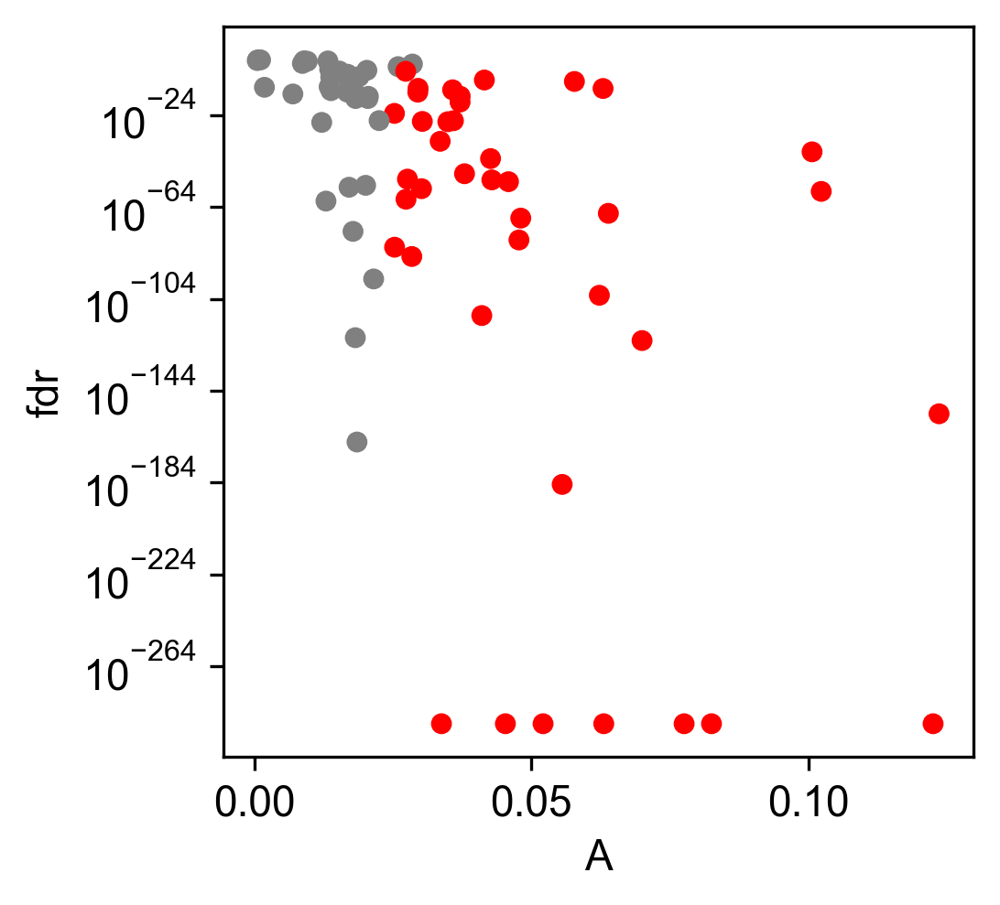

In [40]:
adata_Ib=scf.tl.subset_tree(adata,root_milestone="A",milestones=["Ib"],copy=True)
scf.tl.test_association(adata_Ib,n_jobs=40,A_cut=.025)
scf.pl.test_association(adata_Ib)
scf.tl.fit(adata_Ib,n_jobs=20)
#adata_Ib.write_h5ad("adata_Ib_tree.h5ad")

In [41]:
from scipy.stats import pearsonr
adata_Ia.var["corr"]=list(map(lambda g: pearsonr(adata_Ia.obs.t,adata_Ia[:,g].layers["fitted"].flatten())[0],adata_Ia.var_names))
adata_Ia.var["up"]=adata_Ia.var["corr"]>0
adata_Ib.var["corr"]=list(map(lambda g: pearsonr(adata_Ib.obs.t,adata_Ib[:,g].layers["fitted"].flatten())[0],adata_Ib.var_names))
adata_Ib.var["up"]=adata_Ib.var["corr"]>0
adata_Ic.var["corr"]=list(map(lambda g: pearsonr(adata_Ic.obs.t,adata_Ic[:,g].layers["fitted"].flatten())[0],adata_Ic.var_names))
adata_Ic.var["up"]=adata_Ic.var["corr"]>0
adata_II.var["corr"]=list(map(lambda g: pearsonr(adata_II.obs.t,adata_II[:,g].layers["fitted"].flatten())[0],adata_II.var_names))
adata_II.var["up"]=adata_II.var["corr"]>0

In [42]:
dct=dict(zip(["Ia","Ib","Ic","II"],[adata_Ia,adata_Ib,adata_Ic,adata_II]))

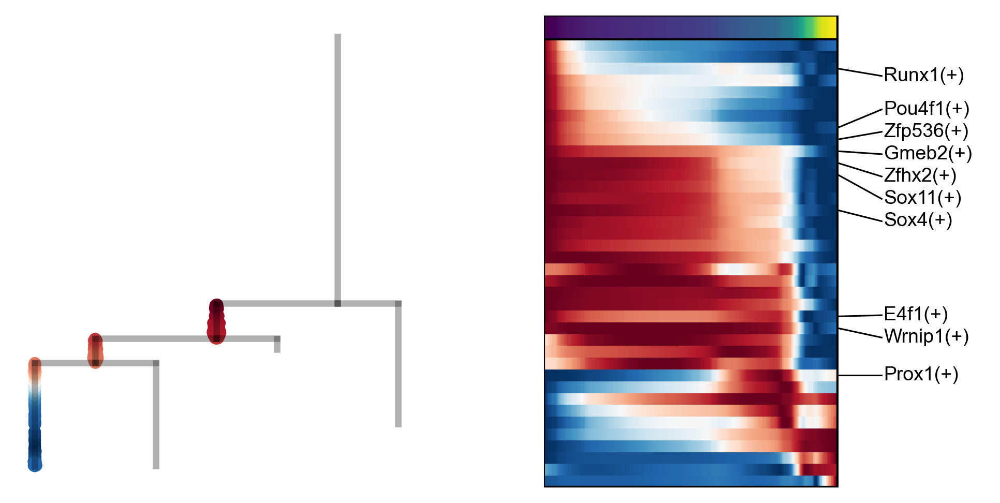

In [43]:
scf.pl.trends(adata_Ia,basis="dendro",ordering="max")

In [44]:
ups=pd.concat([pd.DataFrame({ct:1},index=ad.var_names[ad.var.up]) for ct,ad in dct.items()],axis=1).fillna(0)
downs=pd.concat([pd.DataFrame({ct:1},index=ad.var_names[~ad.var.up]) for ct,ad in dct.items()],axis=1).fillna(0)

In [45]:
ups

,Ia,Ib,Ic,II
Jdp2(+),1.0,0.0,0.0,1.0
Maf(+),1.0,1.0,1.0,1.0
Mafb(+),1.0,0.0,1.0,1.0
Mef2d(+),1.0,0.0,0.0,1.0
Nr1d1(+),1.0,1.0,0.0,0.0
Pbx3(+),1.0,0.0,0.0,1.0
Pou4f2(+),1.0,1.0,0.0,1.0
Ppargc1a(+),1.0,1.0,1.0,0.0
Prox1(+),1.0,1.0,1.0,0.0
Zfp426(+),1.0,1.0,1.0,0.0


In [46]:
alles=pd.concat([pd.DataFrame({ct:1},index=ad.var_names) for ct,ad in dct.items()],axis=1).fillna(0)

In [47]:
alles.idxmax(axis=1)[alles.sum(axis=1)==1].index

Index(['Atf2(+)', 'Hsf1(+)', 'Rora(+)', 'Zfp711(+)', 'Bhlhe22(+)',
       'Zfp354c(+)'],
      dtype='object')

In [48]:
alles

,Ia,Ib,Ic,II
Bach2(+),1.0,1.0,1.0,1.0
Bcl11a(+),1.0,1.0,1.0,1.0
Bclaf1(+),1.0,1.0,1.0,0.0
Crebzf(+),1.0,1.0,1.0,0.0
E4f1(+),1.0,1.0,1.0,0.0
Etv4(+),1.0,1.0,0.0,1.0
Gmeb2(+),1.0,1.0,1.0,0.0
Isl2(+),1.0,1.0,1.0,1.0
Jdp2(+),1.0,0.0,0.0,1.0
Kdm5b(+),1.0,1.0,1.0,0.0


In [50]:
ups.idxmax(axis=1)[ups.sum(axis=1)==1].index

Index(['Bcl11a(+)', 'Rora(+)', 'Runx1(+)', 'Bhlhe22(+)', 'Mafg(+)'], dtype='object')

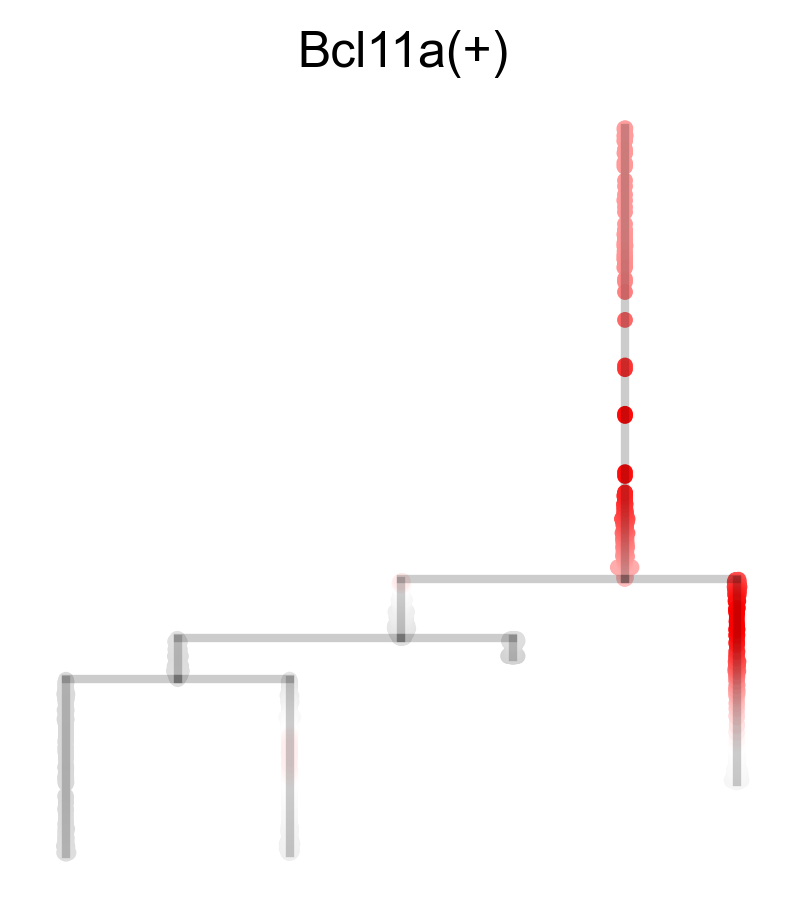

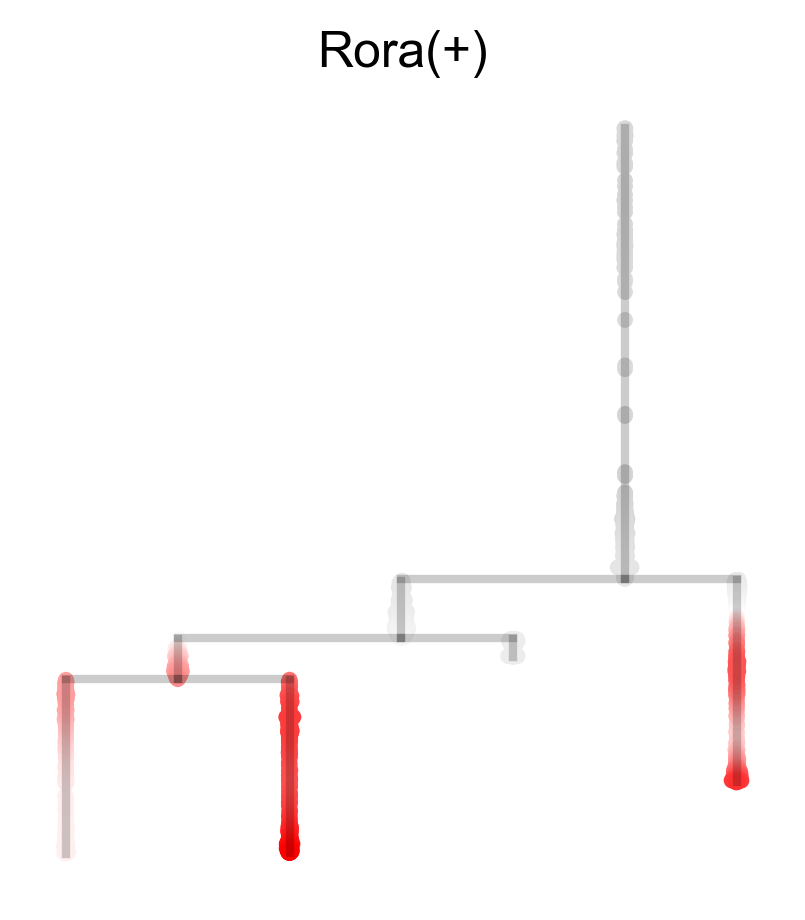

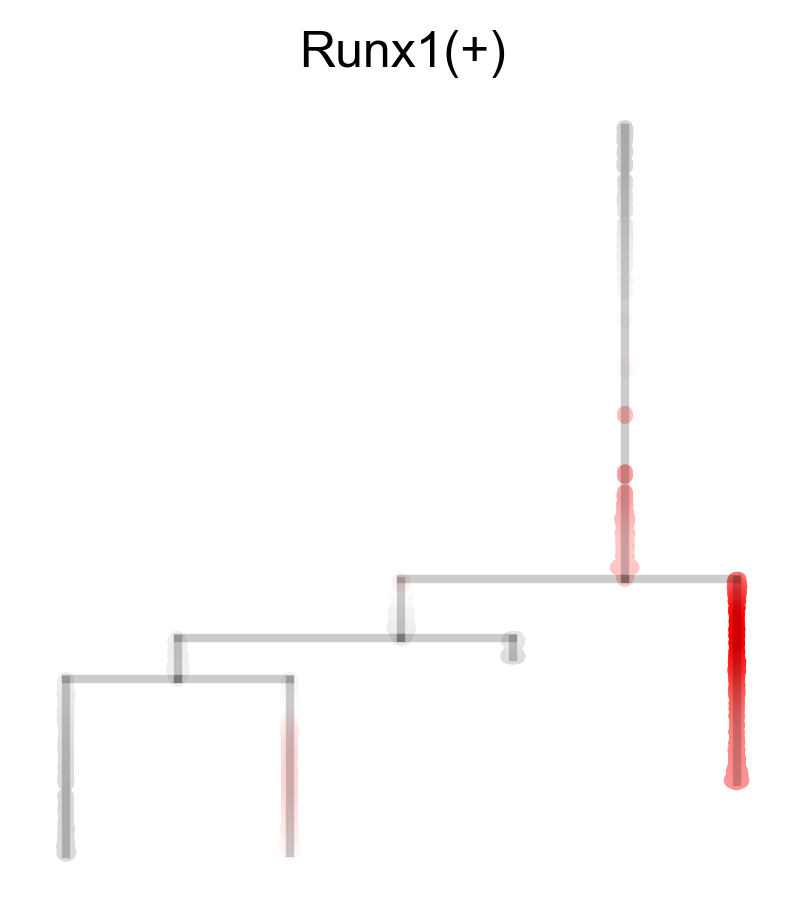

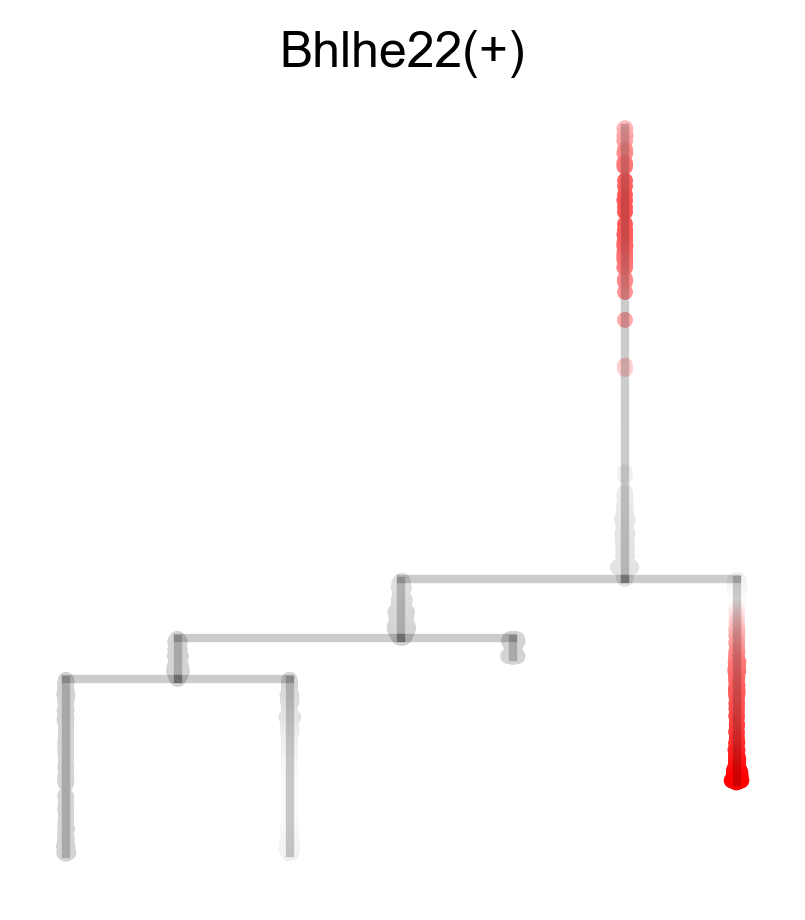

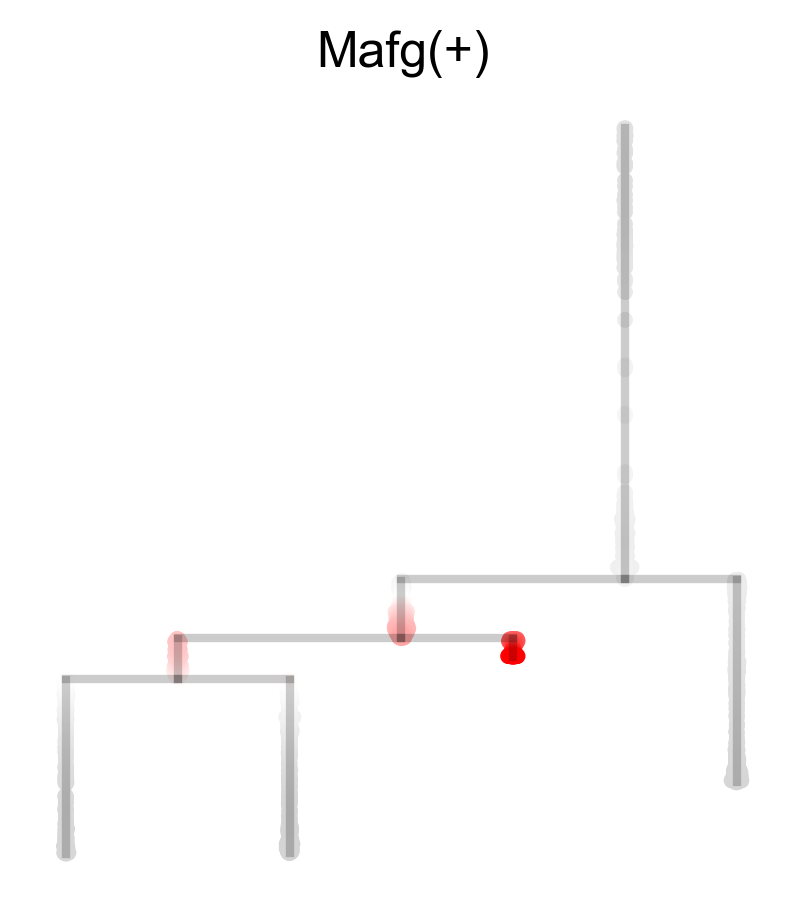

In [51]:
for r in ups.idxmax(axis=1)[ups.sum(axis=1)==1].index:
    scf.pl.dendrogram(adata,color=r,alpha_seg=.2,linewidth_seg=2,
                  show_info=False,cmap=cmap,layer="fitted",save="_{}_regulon.svg".format(r))

In [57]:
alle=np.concatenate([alles.idxmax(axis=1)[alles.sum(axis=1)==1].index,ups.idxmax(axis=1)[ups.sum(axis=1)==1].index])

In [59]:
alle=np.unique(alle)

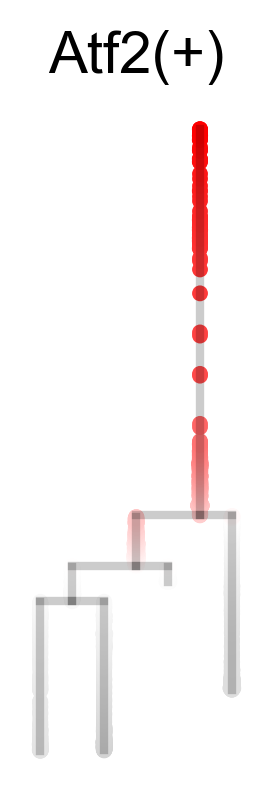

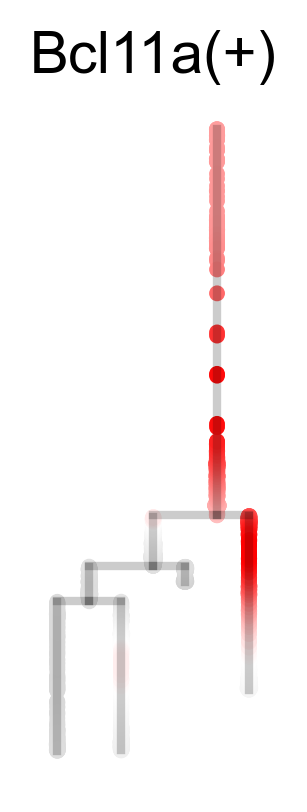

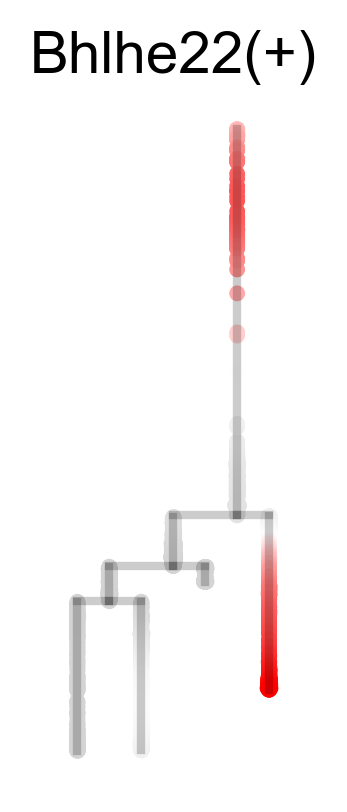

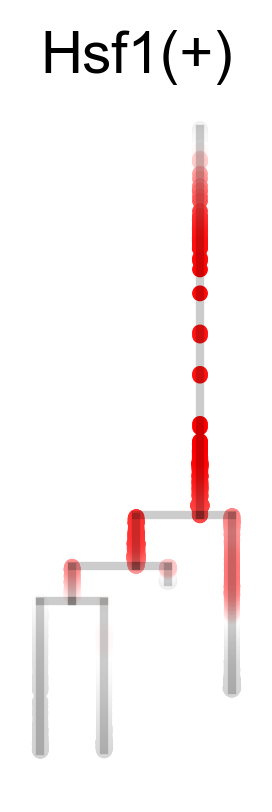

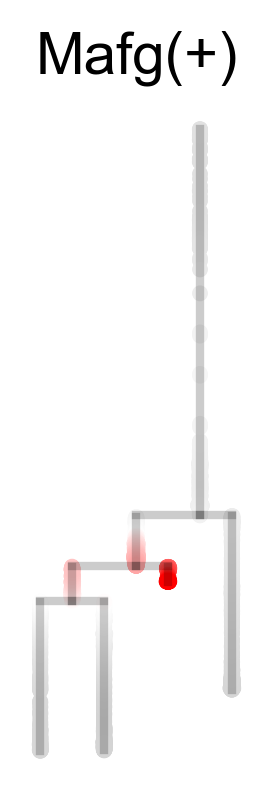

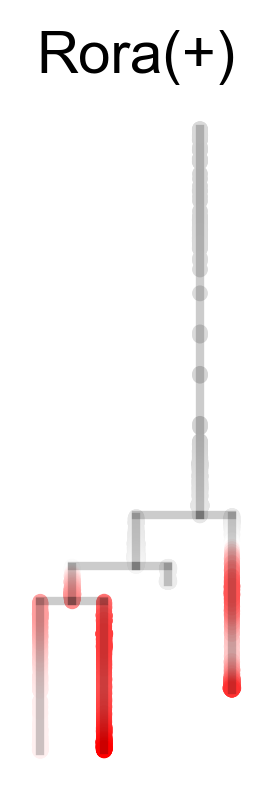

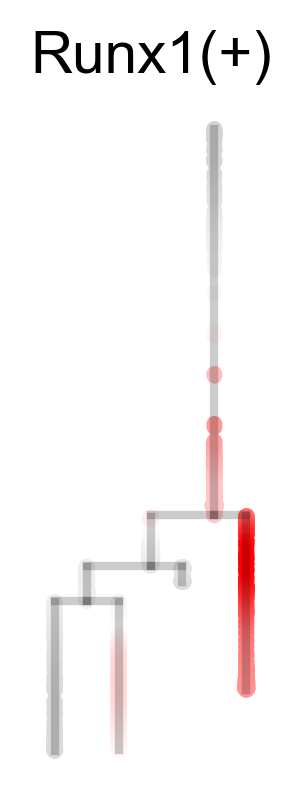

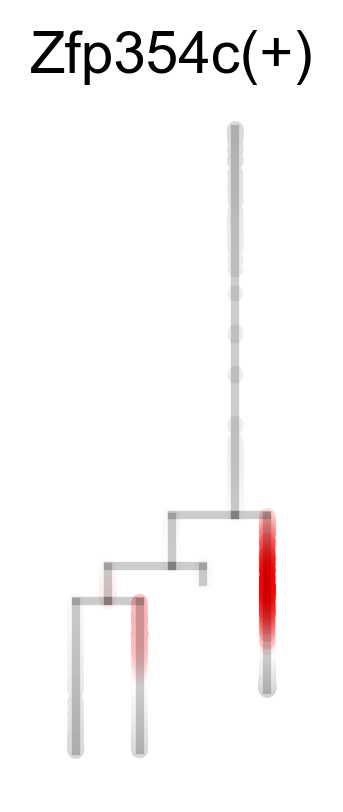

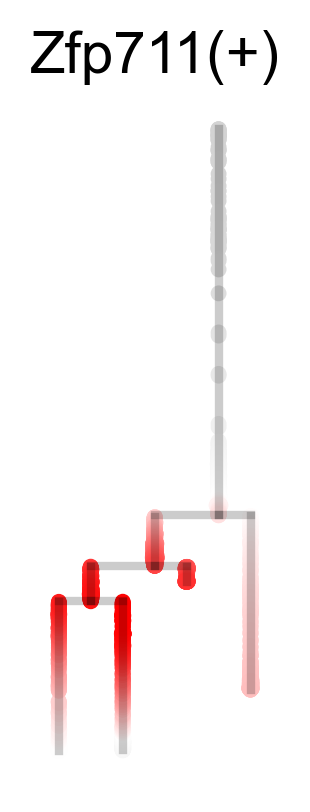

In [63]:
sc.set_figure_params(figsize=(1,3),frameon=False,dpi=150)
for r in alle:
    scf.pl.dendrogram(adata,color=r,alpha_seg=.2,linewidth_seg=2,
                  show_info=False,cmap=cmap,layer="fitted",save="_{}_regulon.svg".format(r))

In [182]:
downs.idxmax(axis=1)[downs.sum(axis=1)==1].index

Index(['Atf2(+)', 'Hsf1(+)', 'Mafb(+)', 'Zfp711(+)', 'Nr1d1(+)', 'Zfp354c(+)'], dtype='object')

In [71]:
sc.set_figure_params(figsize=(1,3),frameon=False,dpi=150,dpi_save=600)
scf.pl.dendrogram(adata,color="Neurod1(+)",alpha_seg=.2,linewidth_seg=2,
                  show_info=False,cmap=cmap,layer="fitted",vmax="p95",save="_Neurod1_regulon.svg")

Bcl11a(+)     Ib
Rora(+)       Ib
Runx1(+)      Ib
Bhlhe22(+)    Ic
Mafg(+)       II
dtype: object

In [72]:
downs.idxmax(axis=1)[downs.sum(axis=1)==1]

Atf2(+)       Ib
Hsf1(+)       Ib
Mafb(+)       Ib
Zfp711(+)     Ib
Nr1d1(+)      Ic
Zfp354c(+)    Ic
dtype: object

In [73]:
alles.idxmax(axis=1)[alles.sum(axis=1)==1]

Atf2(+)       Ib
Hsf1(+)       Ib
Rora(+)       Ib
Zfp711(+)     Ib
Bhlhe22(+)    Ic
Zfp354c(+)    Ic
dtype: object

In [74]:
scf.tl.cluster(adata_Ia,knn=5,metric="correlation")
scf.tl.cluster(adata_Ib,knn=5,metric="correlation")
scf.tl.cluster(adata_Ic,knn=5,metric="correlation")
scf.tl.cluster(adata_II,knn=5,metric="correlation")

    clustering using phenograph
Finding 5 nearest neighbors using correlation metric and 'brute' algorithm
Neighbors computed in 0.006175518035888672 seconds
Jaccard graph constructed in 0.0033597946166992188 seconds
Wrote graph to binary file in 0.0021572113037109375 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.719018
Louvain completed 21 runs in 1.152003526687622 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.159487247467041 seconds
    finished (0:04:21) --> added
    .var['fit_clusters'], cluster assignments for features.
    clustering using phenograph
Finding 5 nearest neighbors using correlation metric and 'brute' algorithm
Neighbors computed in 0.006043195724487305 seconds
Jaccard graph constructed in 0.006512880325317383 seconds
Wrote graph to binary file in 0.001592397689819336 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.650185
Louvain completed 21 runs i

In [75]:
adata_Ia.var.fit_clusters.unique()

array([-1,  0])

In [76]:
adata_Ib.var.fit_clusters.unique()

array([ 0, -1])

In [77]:
adata_Ic.var.fit_clusters.unique()

array([-1,  0])

In [78]:
adata_II.var.fit_clusters.unique()

array([-1])

In [49]:
scf.tl.test_association(adata,n_jobs=20,A_cut=0.01)

test features for association with the trajectory
    single mapping :   0%|          | 0/427 [00:00<?, ?it/s]

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


    single mapping : 100%|██████████| 427/427 [00:16<00:00, 25.64it/s]
    found 140 significant features (0:00:16) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.


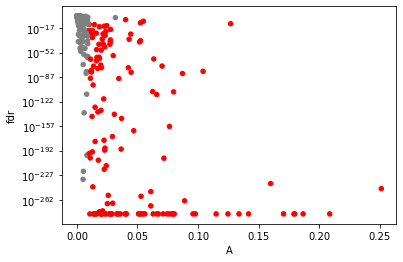

In [50]:
scf.pl.test_association(adata)

In [51]:
scf.tl.fit(adata,n_jobs=20)

fit features associated with the trajectory
    single mapping :   0%|          | 0/140 [00:00<?, ?it/s]

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


    single mapping : 100%|██████████| 140/140 [00:03<00:00, 38.48it/s]
    finished (adata subsetted to keep only fitted features!) (0:00:03) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


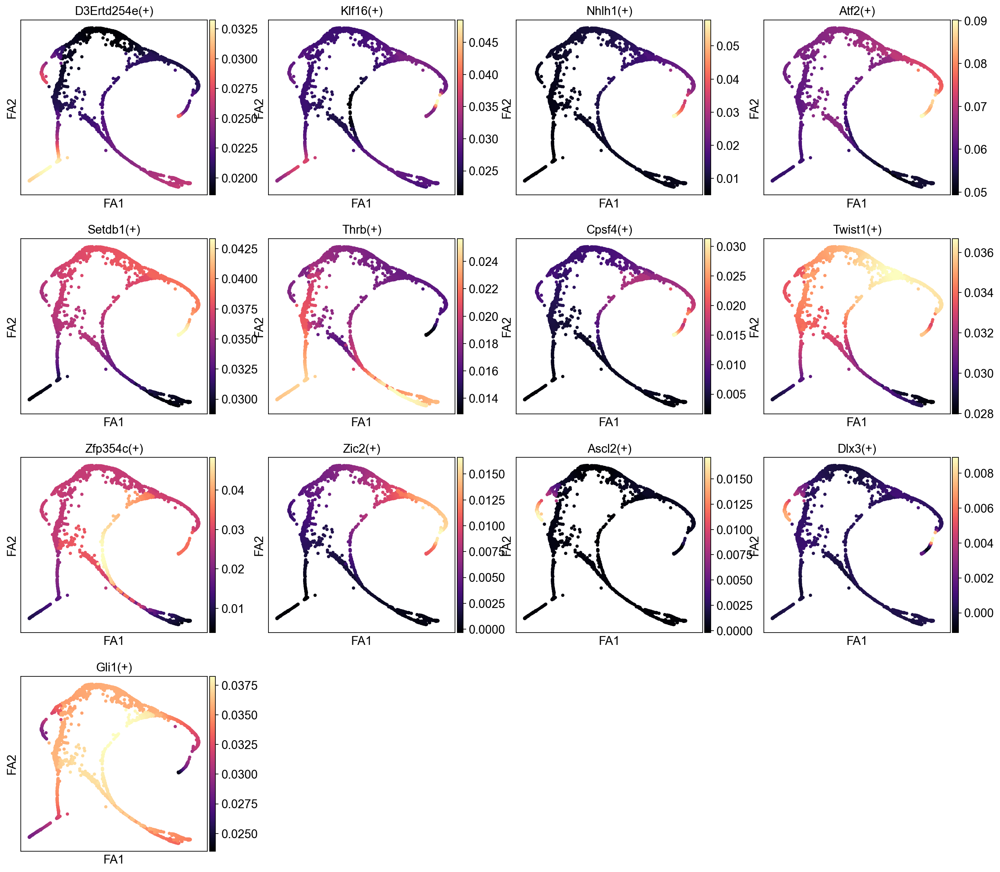

In [66]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=alles.idxmax(axis=1)[alles.sum(axis=1)==1].index,layer="fitted",cmap="magma")

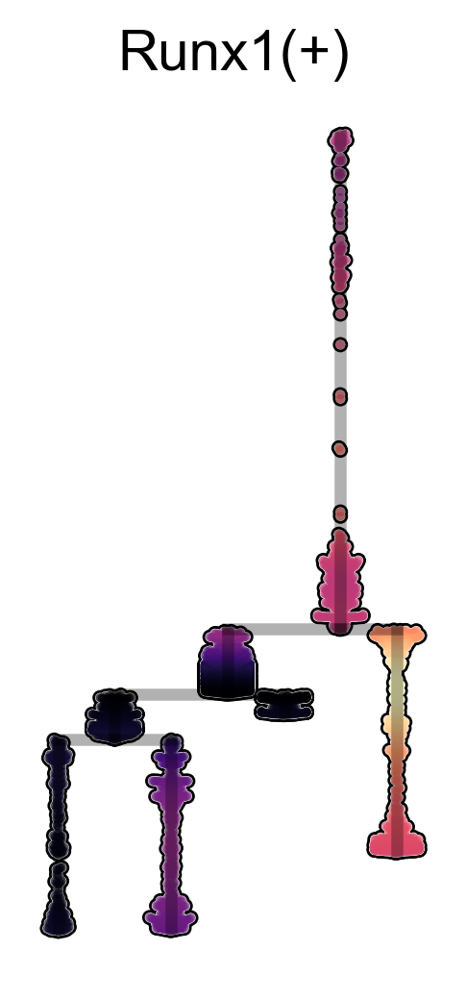

In [86]:
sc.set_figure_params(figsize=(2,4),frameon=False,dpi=150)
scf.pl.dendrogram(adata,color="Runx1(+)",layer="fitted",s=20,cmap="magma",add_outline=True,show_info=False)

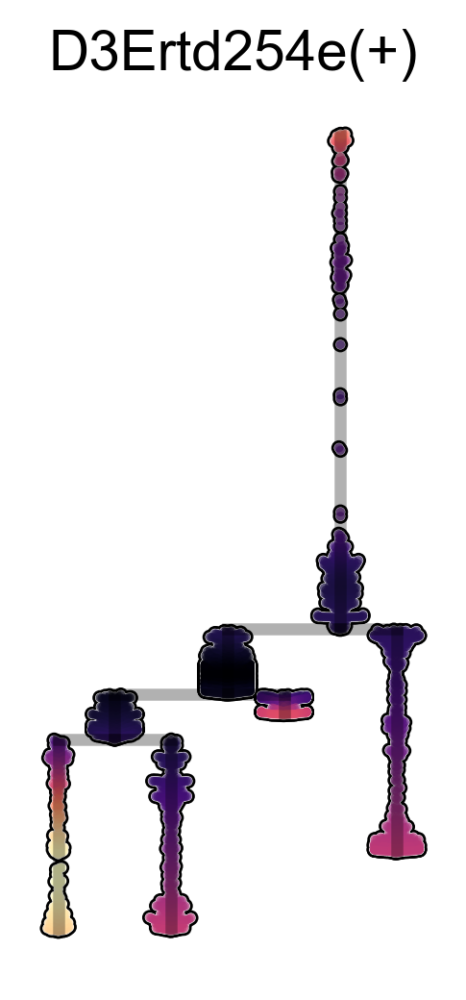

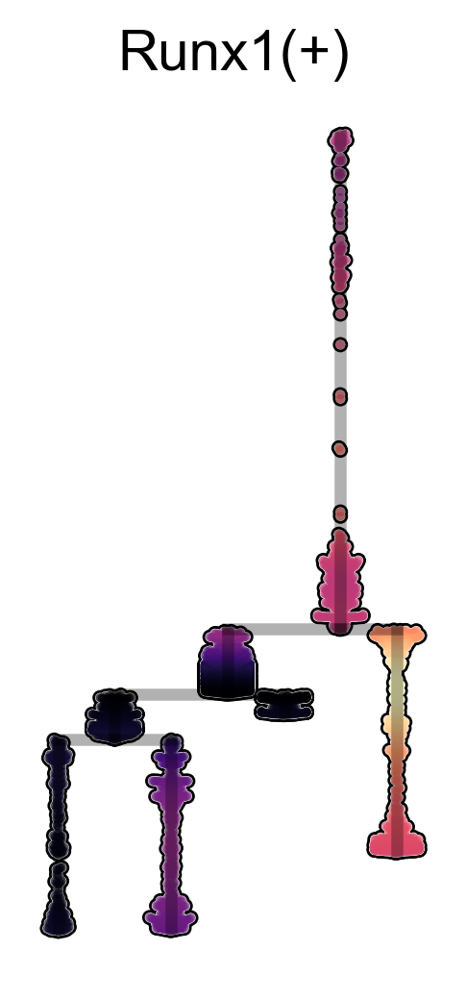

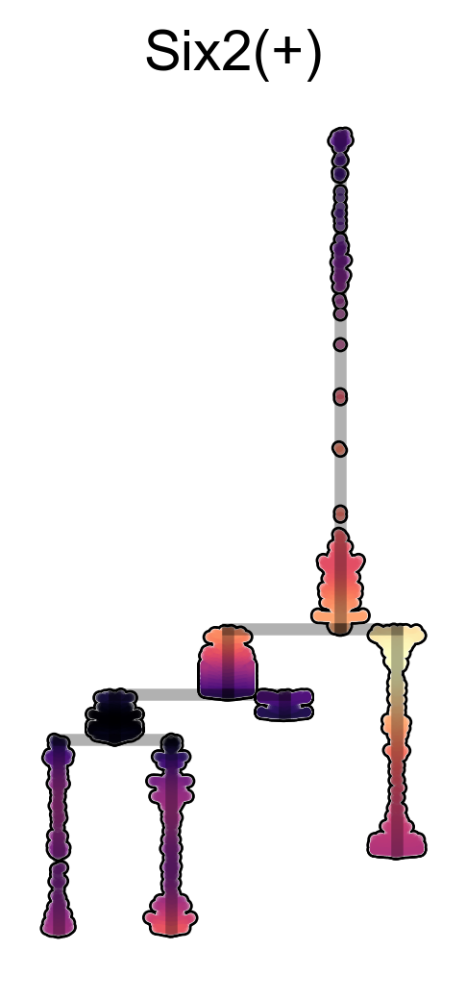

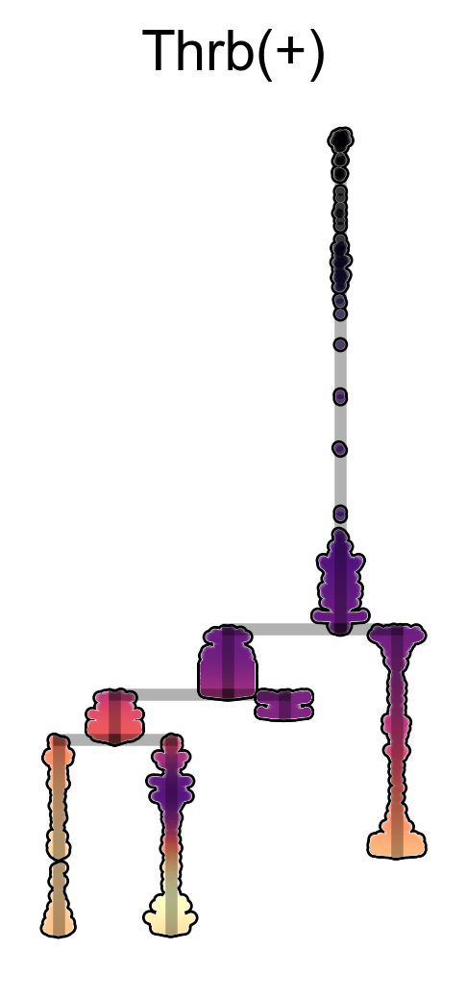

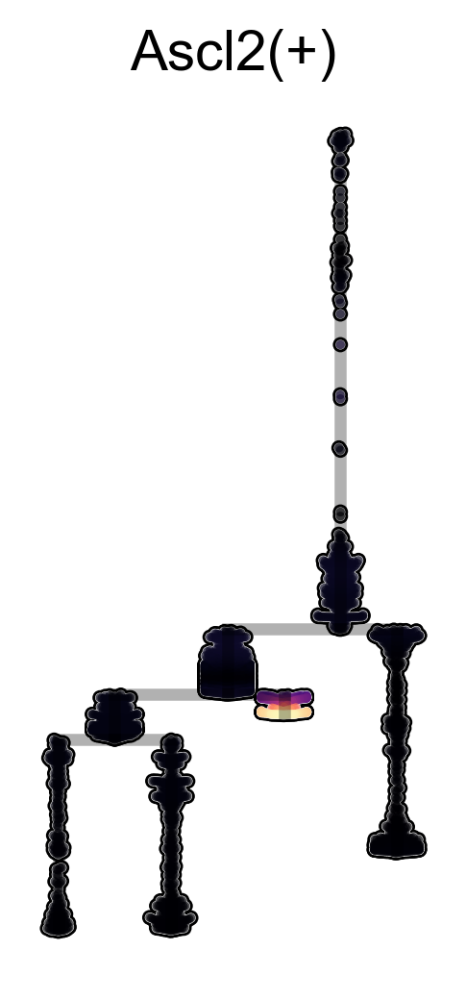

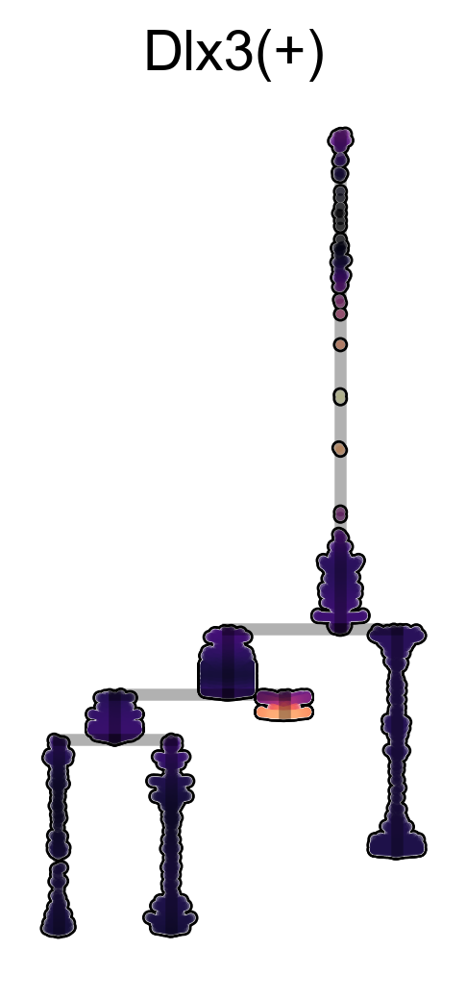

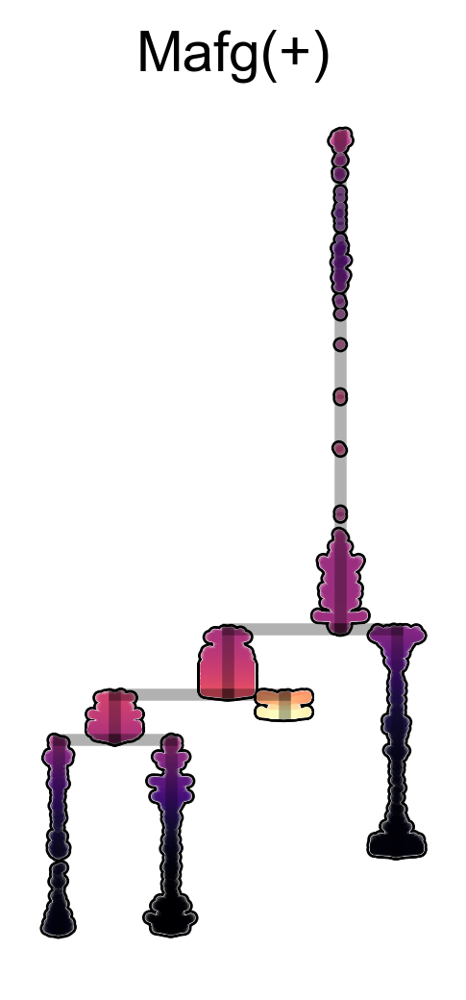

In [89]:
for g in ["D3Ertd254e(+)","Runx1(+)","Six2(+)","Thrb(+)","Ascl2(+)","Dlx3(+)","Mafg(+)"]:
    scf.pl.dendrogram(adata,color=g,layer="fitted",s=20,cmap="magma",add_outline=True,show_info=False,save=g+".svg")

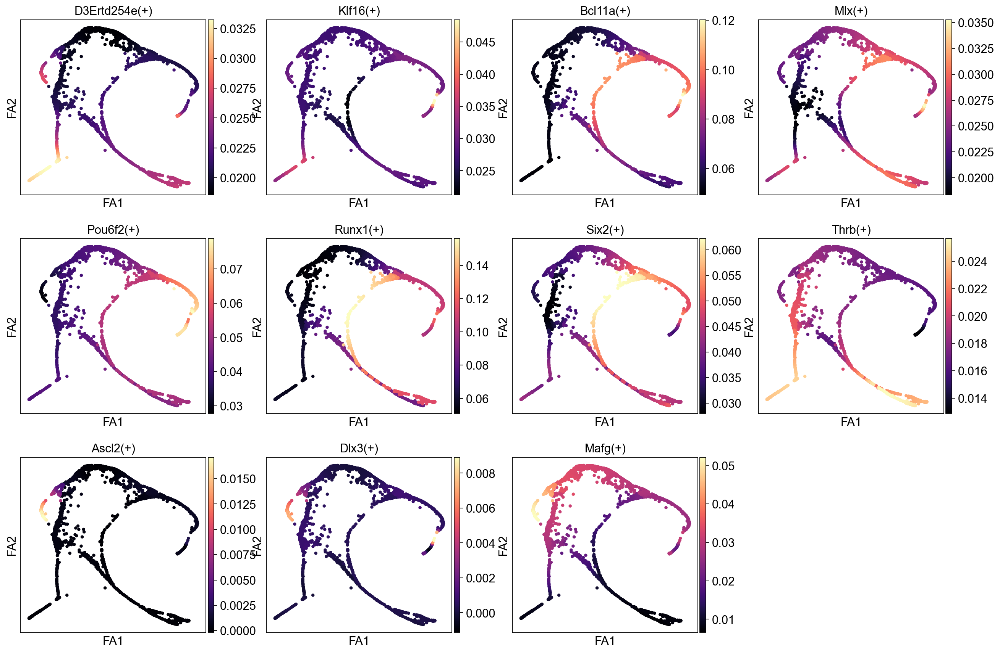

In [65]:
sc.set_figure_params()
sc.pl.draw_graph(adata,color=ups.idxmax(axis=1)[ups.sum(axis=1)==1].index,layer="fitted",cmap="magma")

In [53]:
adata[:,alles.idxmax(axis=1)[alles.sum(axis=1)==1].index]

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


View of AnnData object with n_obs × n_vars = 2072 × 13
    obs: 'batch', 'plate', 'devtime', 'n_genes_by_counts', 'total_counts', 'total_counts_ERCC', 'pct_counts_ERCC', 'doublet_score', 'leiden', 'leiden_diagnostic', 't', 'seg', 'edge', 'milestones', 'devtime_float'
    var: 'p_val', 'A', 'fdr', 'st', 'signi'
    uns: 'dendro_segments', 'devtime_colors', 'draw_graph', 'graph', 'leiden', 'leiden_colors', 'leiden_diagnostic_colors', 'log1p', 'milestones_colors', 'neighbors', 'ppt', 'pseudotime_list', 'scrublet', 'seg_colors', 'tsne', 'umap', 'stat_assoc_list'
    obsm: 'X_dendro', 'X_draw_graph_fa', 'X_msdiff', 'X_pca', 'X_tsne', 'X_umap'
    layers: 'fitted'

In [79]:
scf.tl.cluster(adata,knn=5,metric="correlation")

    clustering using phenograph
Finding 5 nearest neighbors using correlation metric and 'brute' algorithm
Neighbors computed in 0.024182558059692383 seconds
Jaccard graph constructed in 0.008118629455566406 seconds
Wrote graph to binary file in 0.005199432373046875 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.797239
Louvain completed 21 runs in 1.1520869731903076 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.264965057373047 seconds
    finished (0:34:21) --> added
    .var['fit_clusters'], cluster assignments for features.


In [80]:
adata.var.fit_clusters.unique()

array([ 5,  1,  3, -1,  0,  4,  2,  6])

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


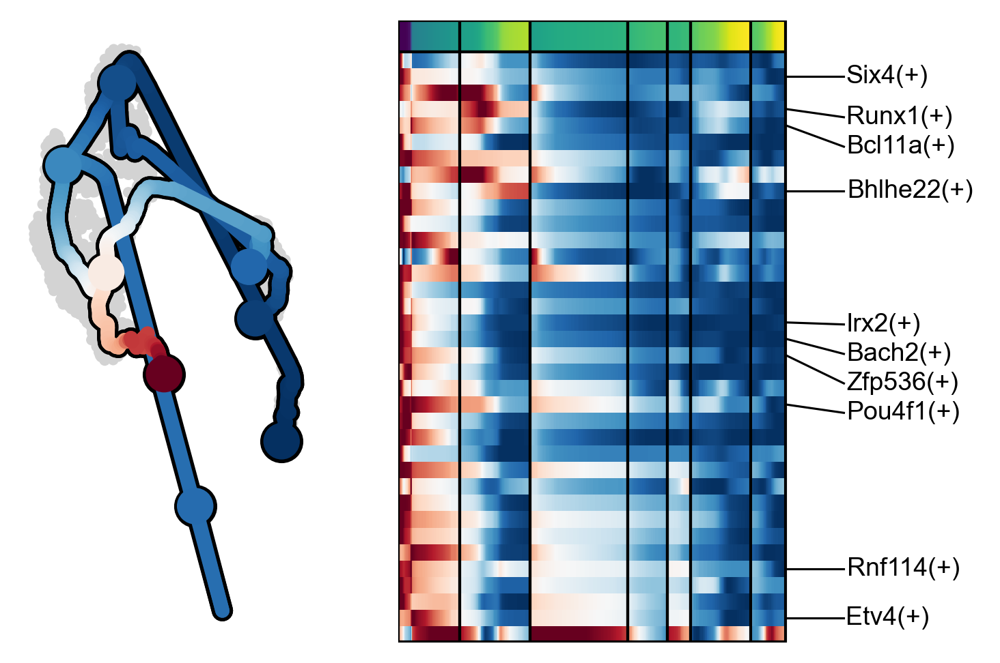

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


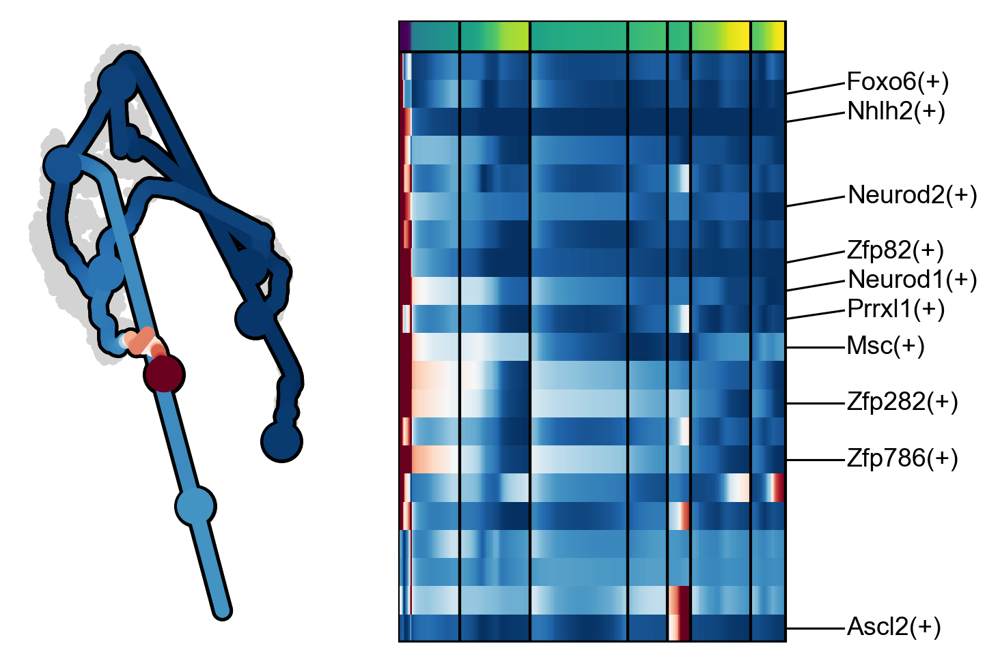

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


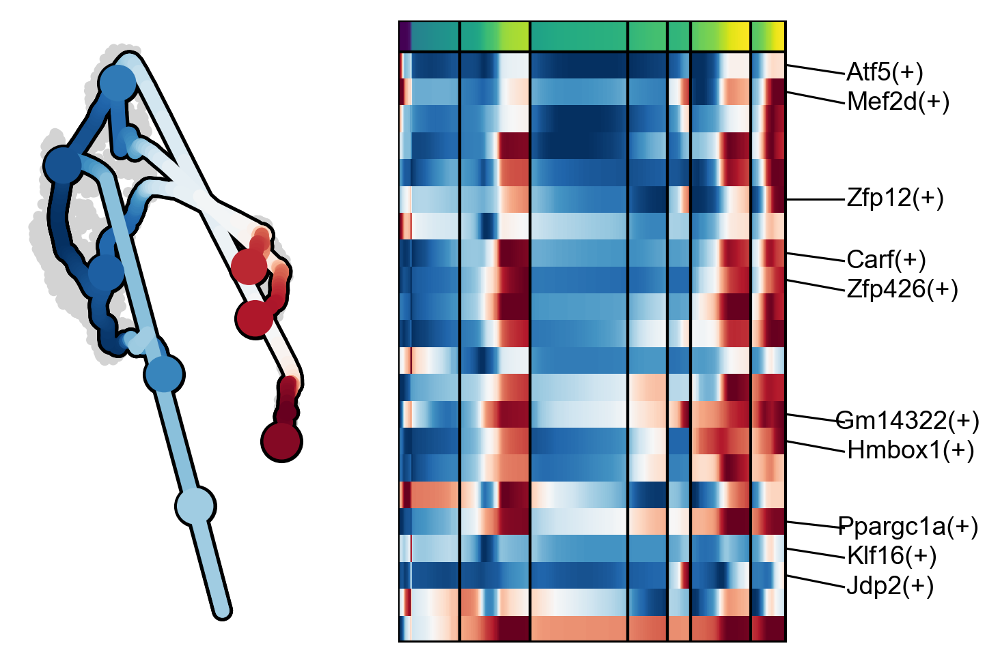

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


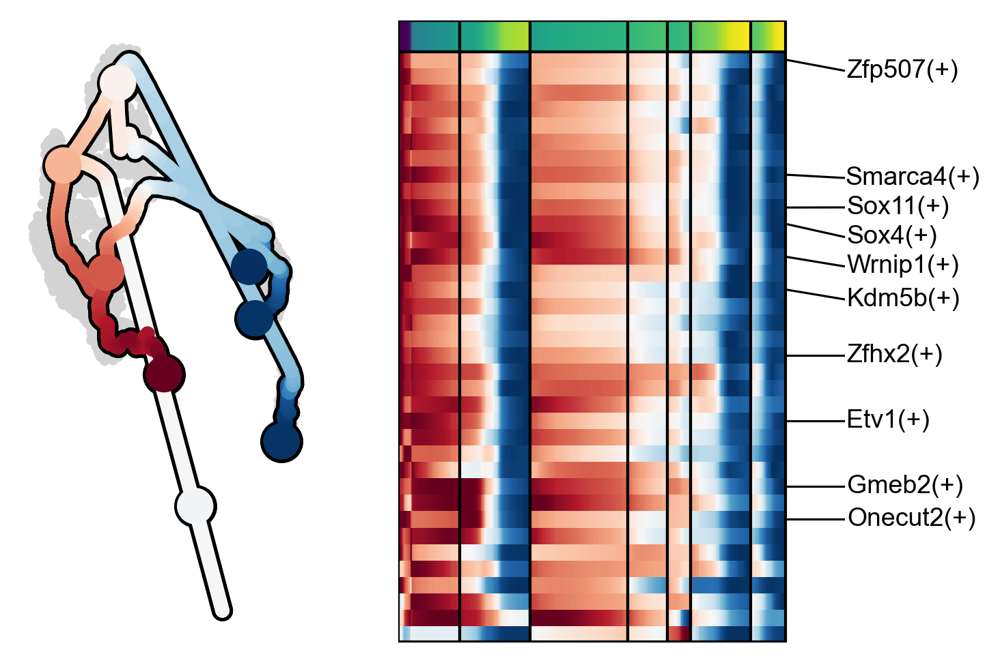

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


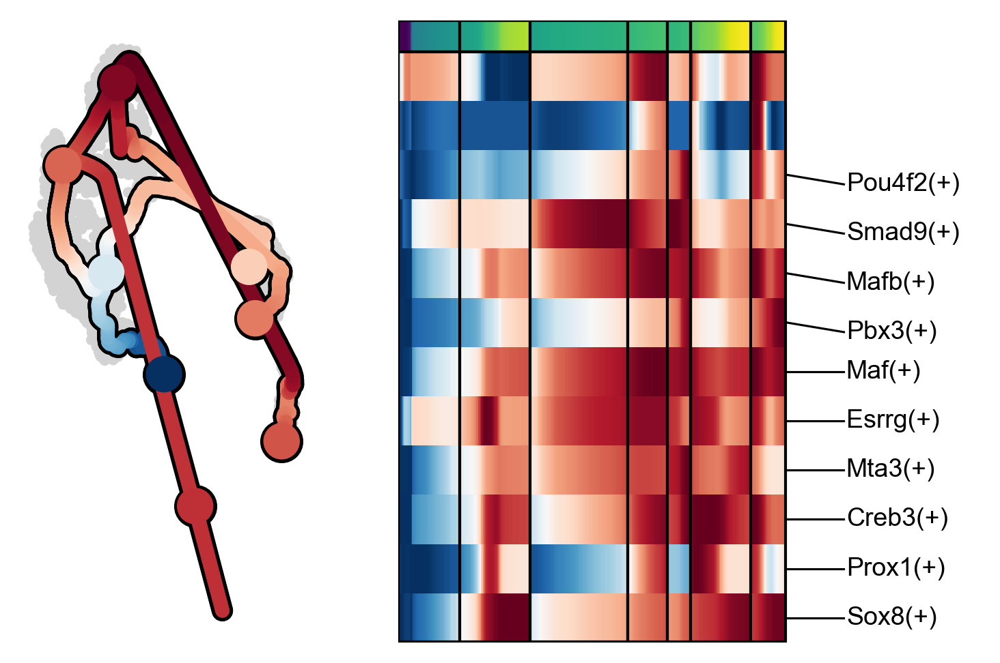

/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


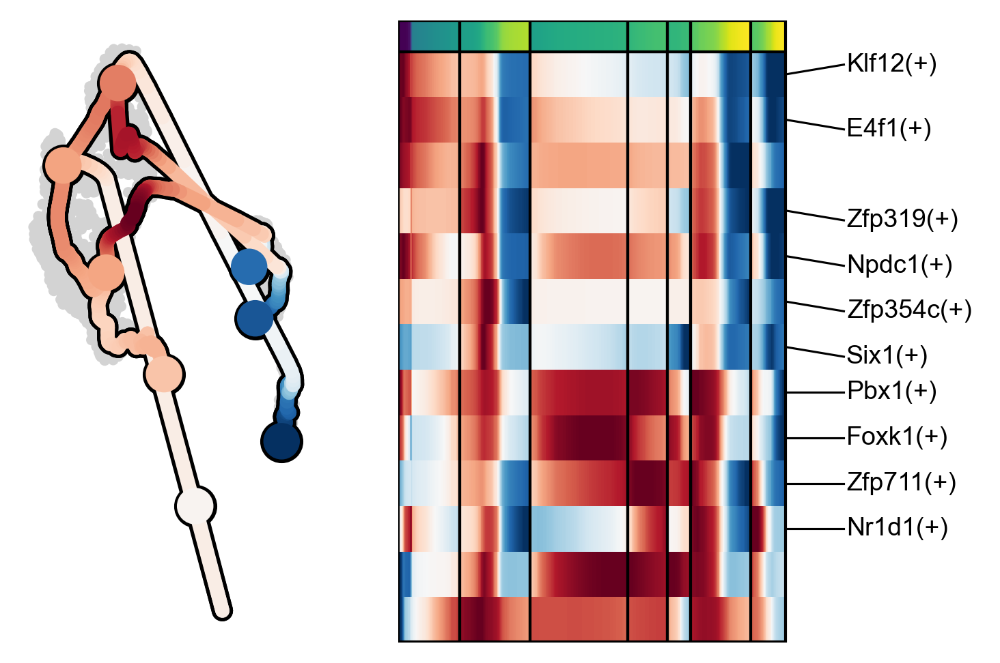

In [290]:
from scipy import stats
from scipy.optimize import minimize_scalar
from sklearn import mixture
seed=0

def get_contours(c,offset=.1):
    scf.pl.trends(adata,features=adata.var_names[adata.var.fit_clusters==c],output_mean=True,show=False)
    data=adata.obs.mean_trajectory
    gmm2 = mixture.GaussianMixture(n_components=2, covariance_type='full', random_state=seed).fit(
                data.values.reshape(-1, 1)
            )
    thre=minimize_scalar(fun=stats.gaussian_kde(data), bounds=sorted(gmm2.means_), method='bounded').x[0]
    thre=thre+offset
    #thre=data.mean() + 2.0 * data.std()
    adata.obs["sel"+str(c)]=(adata.obs.mean_trajectory>thre).astype(str)

    
for c in adata.var.fit_clusters.unique():
    get_contours(c)


In [ ]:
adata.obs

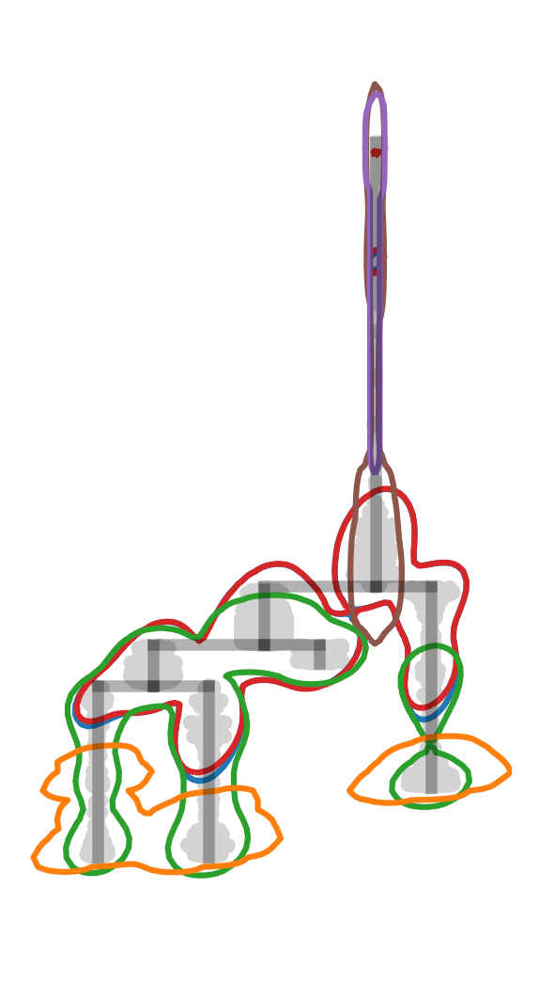

In [292]:
import numpy as np

fig ,ax =plt.subplots(figsize=(2.2,4.4),dpi=150)
scf.pl.dendrogram(adata,show=False,ax=ax,frameon=False)
bins = 100   
xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()
ax.set_xlim([xmin-(xmax-xmin)*.1,xmax+(xmax-xmin)*.1])
ax.set_ylim([ymin-(ymax-ymin)*.1,ymax+(ymax-ymin)*.1])

xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()

# prepare grid for density map
xedges = np.linspace(xmin, xmax, bins)
yedges = np.linspace(ymin, ymax, bins)
xx, yy = np.meshgrid(xedges, yedges)
gridpoints = np.array([xx.ravel(), yy.ravel()])

def get_densities(c):
    x=adata.obsm["X_dendro"][adata.obs["sel"+str(c)]=="True",0]
    y=adata.obsm["X_dendro"][adata.obs["sel"+str(c)]=="True",1]

    xy = np.vstack((x, y))
    dens = stats.gaussian_kde(xy,bw_method=.2)
    z = dens(xy)

    # mask points above density threshold
    threshold = 0.01
    x = np.ma.masked_where(z > threshold, x)
    y = np.ma.masked_where(z > threshold, y)

    zz = np.reshape(dens(gridpoints), xx.shape)

    return zz,sum(z > threshold)

res=dict(zip(adata.var.fit_clusters.unique(),[get_densities(c) for c in adata.var.fit_clusters.unique()]))
sizes=pd.Series([res[c][1] for c in adata.var.fit_clusters.unique()],index=adata.var.fit_clusters.unique())
cols=["tab:blue","tab:red","tab:green","tab:orange","tab:brown","tab:purple"]
for i,c in enumerate(sizes.sort_values(ascending=False).index):
    #cs = ax.contourf(xx, yy, res[c][0], levels=[threshold,threshold+1], colors=cols[i],zorder=-10+1)
    cs = ax.contour(xx, yy, res[c][0], levels=[threshold], colors=cols[i])

In [294]:
sizes.sort_values(ascending=False).index

Int64Index([4, 1, 5, 2, 0, 3], dtype='int64')

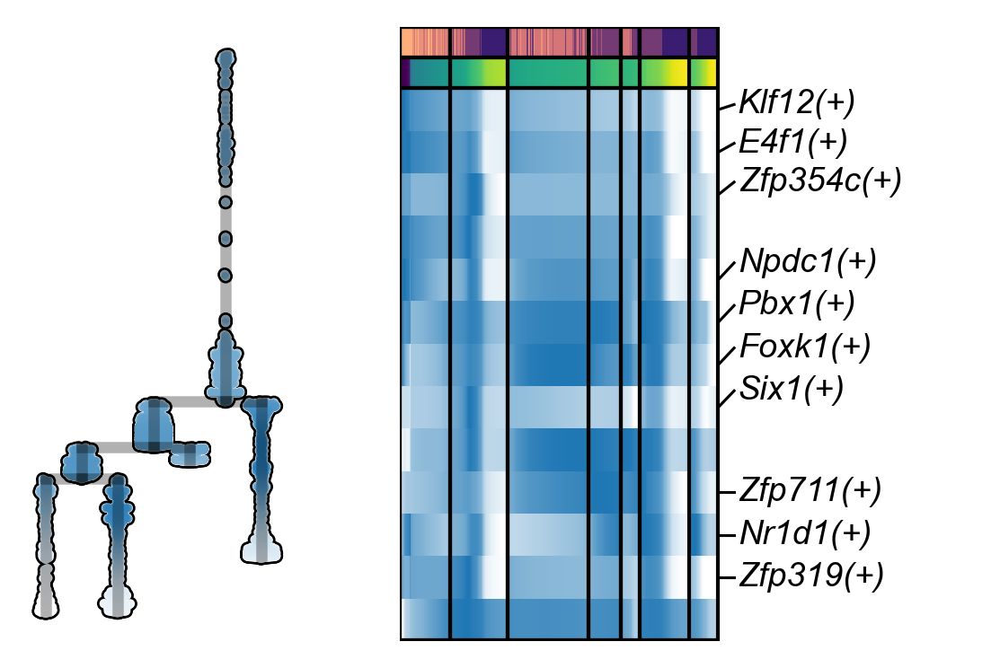

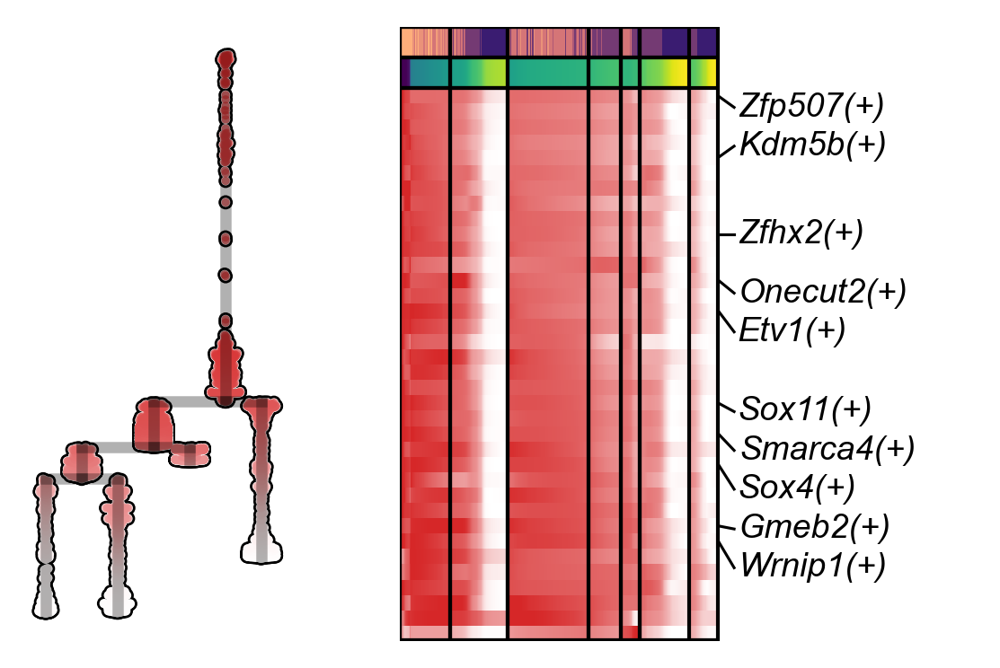

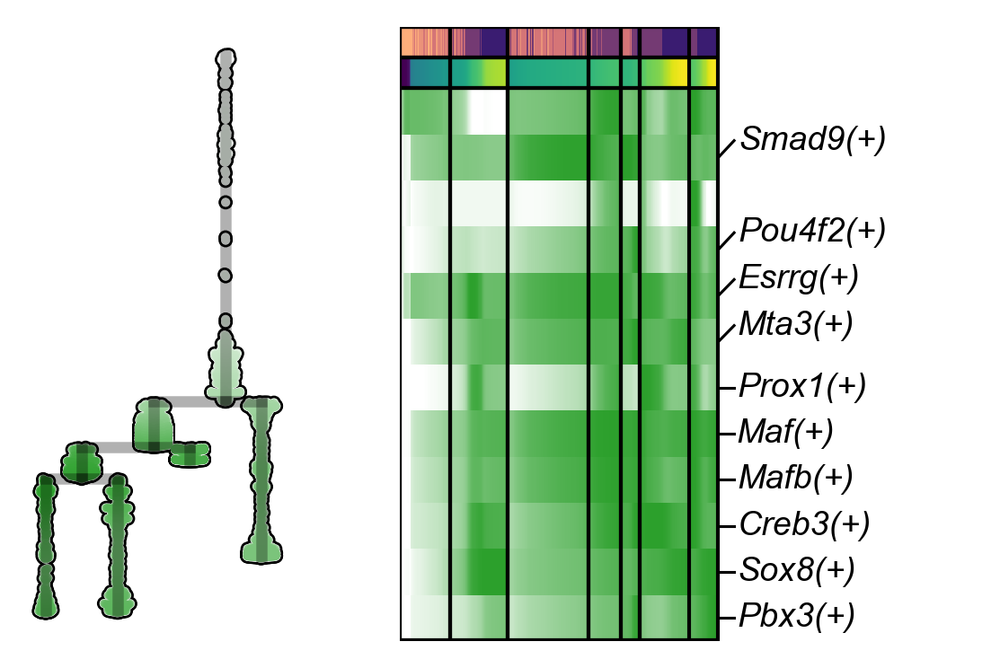

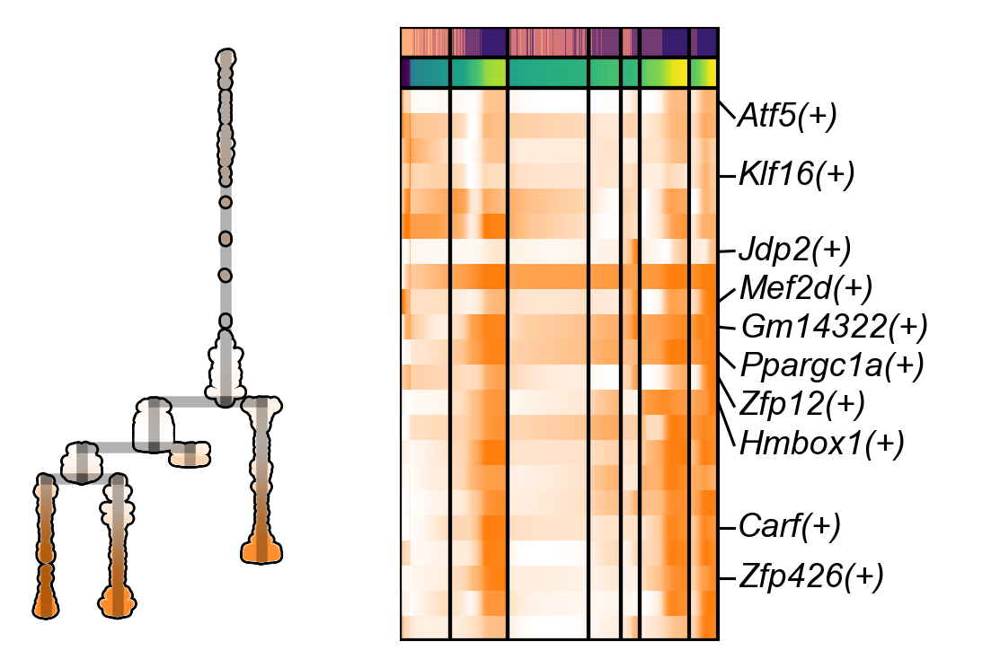

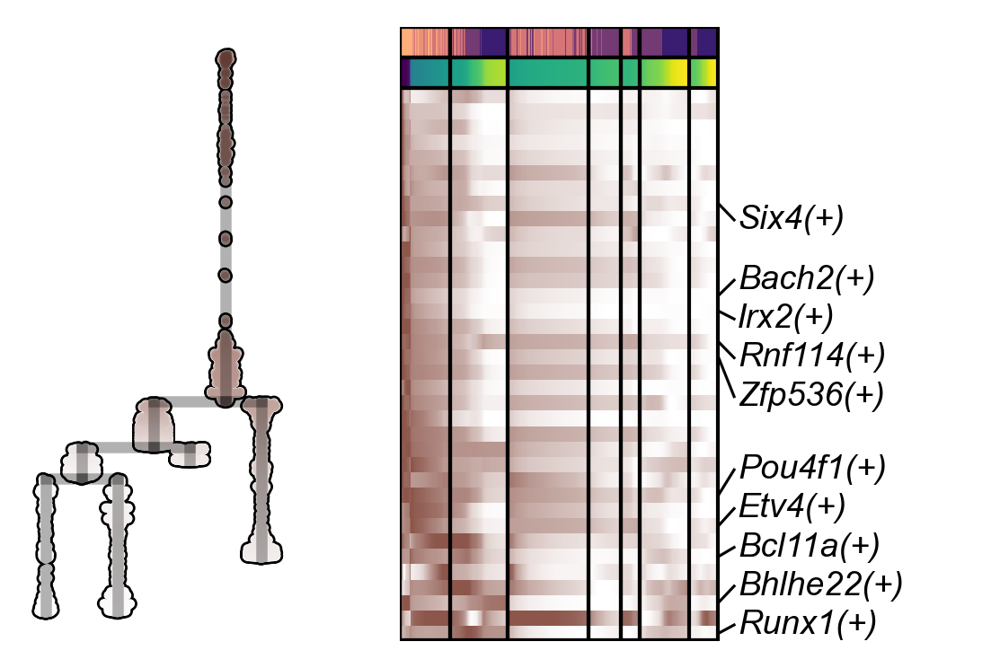

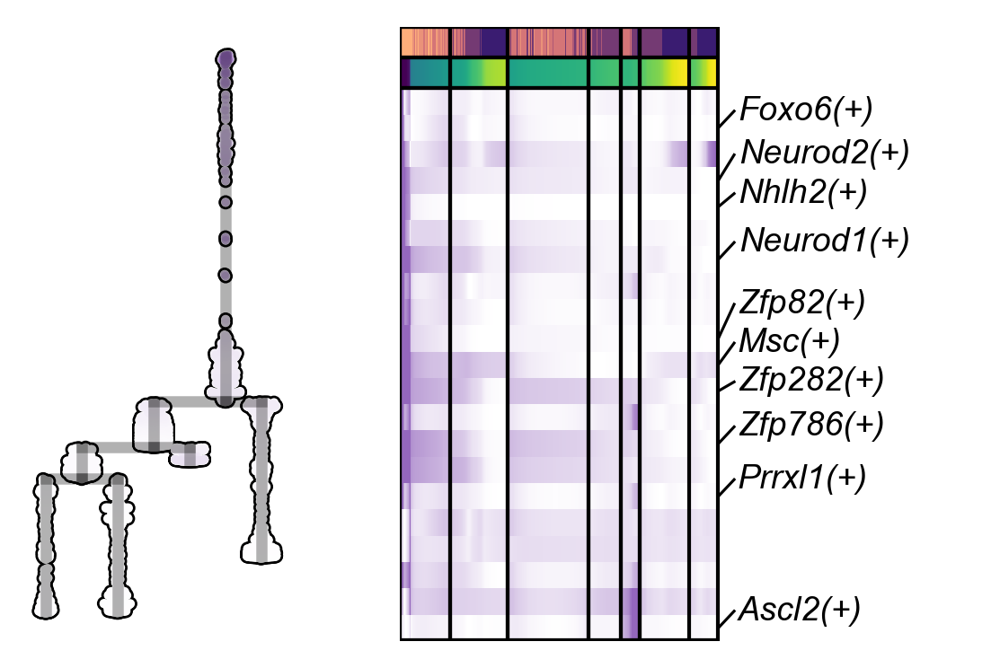

In [293]:
from matplotlib.colors import LinearSegmentedColormap
sc.set_figure_params(figsize=(2,4),dpi_save=600,frameon=False,dpi=150)
for i,c in enumerate(sizes.sort_values(ascending=False).index):
    scf.pl.trends(adata,features=adata.var_names[adata.var.fit_clusters==c],
                  style="italic",annot="devtime",
                  feature_cmap=LinearSegmentedColormap.from_list(name="tab",colors=["white",cols[i]]),
                  add_outline=True,s=20,fig_heigth=3,heatmap_space=.2,offset_names=.05,
                  basis="dendro",ordering="max",pseudo_cmap="viridis")